#Hands-on Activity 5.1 Generating Images with GANs and VAEs

#Procedures and Discussion: Variational Autoencoders and GANs

In [56]:
# system libraries
import sys
import warnings
import os
import glob
warnings.filterwarnings("ignore")

# image libraries
import cv2 # requires installing opencv (e.g., pip install opencv-python)
from imgaug import augmenters # requires installing imgaug (e.g., pip install imgaug)

# math/numerical libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
from scipy.stats import norm
from sklearn.model_selection import train_test_split

import tensorflow as tf

# deep learning libraries
from keras.models import Model, Sequential
from keras.optimizers import Adam, RMSprop

from keras.layers import *
from keras import backend as K
# from keras.callbacks import EarlyStopping
# from keras.utils import to_categorical
# from keras.metrics import *
# from keras.preprocessing import image, sequence
#

print(tf.__version__)

2.15.0


## Part 1: Autoencoders (AEs)

Answer: What is the typical architecture of a 'vanilla/standard/traditional' autoencoder.

### Data: Acquisition and Pre-processing
We will be using Fashion-MNIST, which can be conveniently accessed with Keras.

4422102/4422102 [==============================] - 0s 0us/step
X_train shape: (60000, 28, 28), X_test shape: (10000, 28, 28)
y_train shape: (60000,), and y_test shape: (10000,)


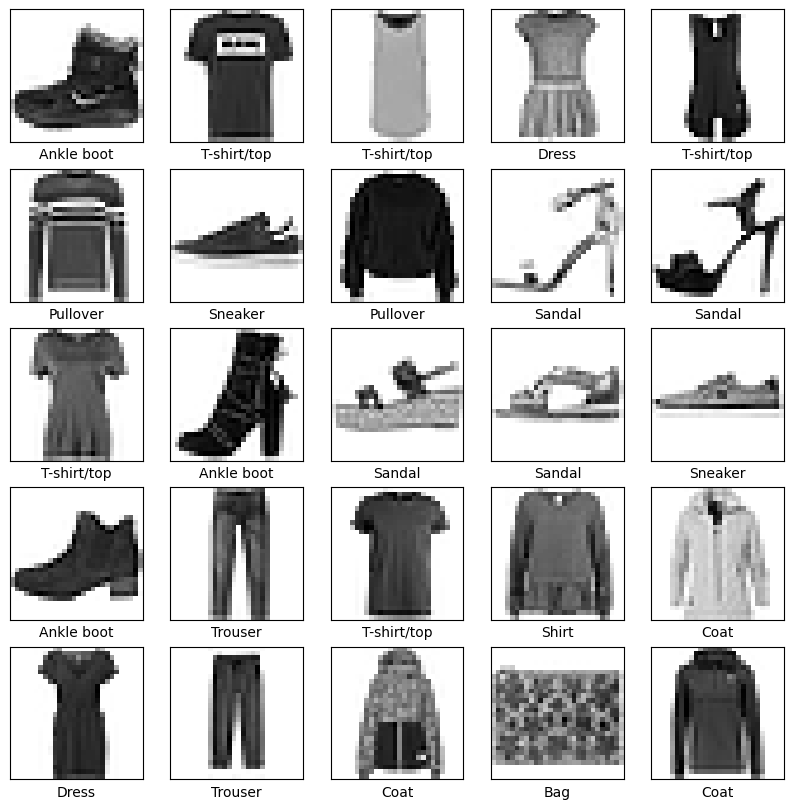

In [ ]:
# get the data from keras - how convenient!
fashion_mnist = tf.keras.datasets.fashion_mnist

# load the data and split it into training and testing sets
(X_train, y_train),(X_test, y_test) = fashion_mnist.load_data()

# normalize the data by dividing with pixel intensity
# (each pixel is 8 bits so its value ranges from 0 to 255)
X_train, X_test = X_train / 255.0, X_test / 255.0

print(f'X_train shape: {X_train.shape}, X_test shape: {X_test.shape}')
print(f'y_train shape: {y_train.shape}, and y_test shape: {y_test.shape}')

# classes are named 0-9 so define names for plotting clarity
class_names = ['T-shirt/top', 'Trouser', 'Pullover', 'Dress', 'Coat',
               'Sandal', 'Shirt', 'Sneaker', 'Bag', 'Ankle boot']

# display the first 25 garments from the training set
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_train[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[y_train[i]])
plt.show()

#### Add Noise to the Images

In attempt to make the autoencoder more robust and not just memorize the inputs, let's add noise to the inputs but calculate its loss based on how similar its outputs are to the original (non-denoised) images.

Check out imgaug docs for more info and other ways to add noise.

In [ ]:
# Neural Networks want the inputs to be 3D
n_samples, h, w = X_train.shape

X_train = X_train.reshape(-1, h, w, 1)
X_test = X_test.reshape(-1, h, w, 1)

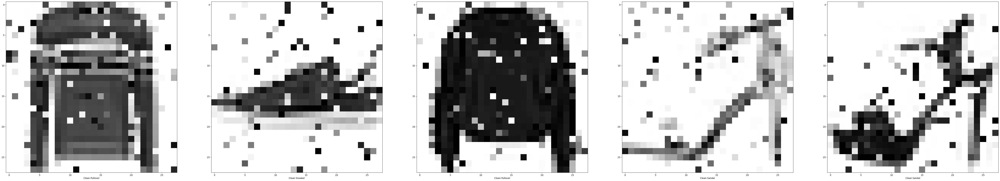

In [ ]:
# Adding some 'salt and pepper' noises
noise = augmenters.SaltAndPepper(0.1)
seq_object = augmenters.Sequential([noise])

X_train_n = seq_object.augment_images(X_train * 255) / 255
X_test_n = seq_object.augment_images(X_test * 255) / 255

f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i in range(5,10):
    ax[i-5].imshow(X_train_n[i, :, :, 0].reshape(28, 28), cmap=plt.cm.binary)
    ax[i-5].set_xlabel('Clean '+class_names[y_train[i]])

#### Create the Autoencoder

In [ ]:
# input layer
input_layer = tf.keras.layers.Input(shape=(28, 28, 1))

# encoding architecture
encoded_layer1 = tf.keras.layers.Conv2D(64,(3, 3), activation='relu', padding='same')(input_layer)
encoded_layer1 = tf.keras.layers.MaxPool2D((2, 2), padding='same')(encoded_layer1)
encoded_layer2 = tf.keras.layers.Conv2D(32,(3, 3), activation='relu', padding='same')(encoded_layer1)
encoded_layer2 = tf.keras.layers.MaxPool2D((2, 2), padding='same')(encoded_layer2)
encoded_layer3 = tf.keras.layers.Conv2D(16,(3, 3), activation='relu', padding='same')(encoded_layer2)
latent_view = tf.keras.layers.MaxPool2D((2, 2), padding='same')(encoded_layer3)

# decoding architecture
decoded_layer1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(latent_view)
decoded_layer1 = tf.keras.layers.UpSampling2D((2, 2))(decoded_layer1)
decoded_layer2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(decoded_layer1)
decoded_layer2 = tf.keras.layers.UpSampling2D((2, 2))(decoded_layer2)
decoded_layer3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu')(decoded_layer2)
decoded_layer3 = tf.keras.layers.UpSampling2D((2, 2))(decoded_layer3)
output_layer = tf.keras.layers.Conv2D(1,(3, 3), padding='same')(decoded_layer3)

# compile the model
model = tf.keras.Model(input_layer, output_layer)
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 28, 28, 1)]       0         
                                                                 
 conv2d (Conv2D)             (None, 28, 28, 64)        640       
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 64)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 32)        18464     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 7, 7, 32)          0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 7, 7, 16)          4624  

#### Train the Autoencoder

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=5, mode='auto')

# epochs=20 for better results
history = model.fit(X_train_n, X_train, epochs=20, batch_size=2048, validation_data=(X_test_n, X_test), callbacks=[early_stopping])

Epoch 1/20
30/30 [==============================] - 7s 223ms/step - loss: 0.0820 - val_loss: 0.0488
Epoch 2/20
30/30 [==============================] - 3s 103ms/step - loss: 0.0407 - val_loss: 0.0347
Epoch 3/20
30/30 [==============================] - 3s 101ms/step - loss: 0.0315 - val_loss: 0.0284
Epoch 4/20
30/30 [==============================] - 3s 102ms/step - loss: 0.0267 - val_loss: 0.0250
Epoch 5/20
30/30 [==============================] - 3s 107ms/step - loss: 0.0242 - val_loss: 0.0232
Epoch 6/20
30/30 [==============================] - 3s 105ms/step - loss: 0.0225 - val_loss: 0.0219
Epoch 7/20
30/30 [==============================] - 3s 103ms/step - loss: 0.0214 - val_loss: 0.0208
Epoch 8/20
30/30 [==============================] - 3s 103ms/step - loss: 0.0203 - val_loss: 0.0198
Epoch 9/20
30/30 [==============================] - 3s 108ms/step - loss: 0.0194 - val_loss: 0.0194
Epoch 10/20
30/30 [==============================] - 3s 106ms/step - loss: 0.0190 - val_loss: 0.0187

In [ ]:
n = np.random.randint(0,len(X_test)-5) # pick a random starting index within our test set

#### Visualize Samples reconstructed by AE

**Denoised Images**

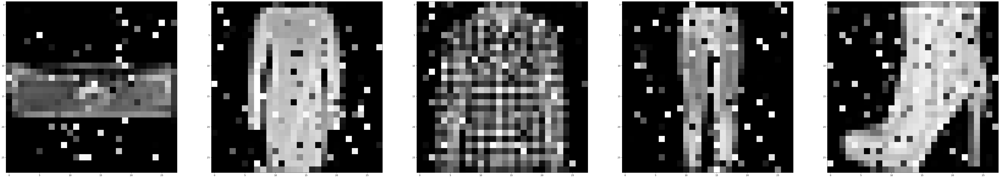

In [ ]:
f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i,a in enumerate(range(n,n+5)):
    ax[i].imshow(X_test_n[a, :, :, 0].reshape(28, 28), cmap='gray')

**Actual Targets (i.e., Original inputs)**

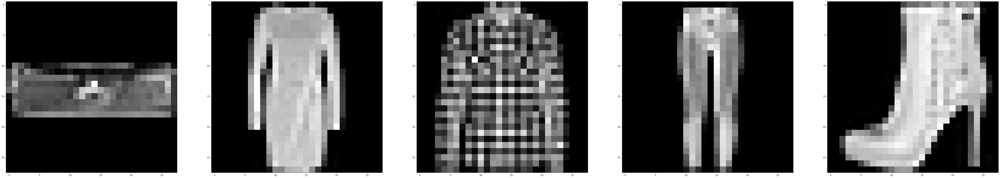

In [ ]:
f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i,a in enumerate(range(n,n+5)): # display the 5 images starting at our random index
    ax[i].imshow(X_test[a, :, :, 0].reshape(28, 28), cmap='gray')

**Predicted Images**

1/1 [==============================] - 0s 437ms/step


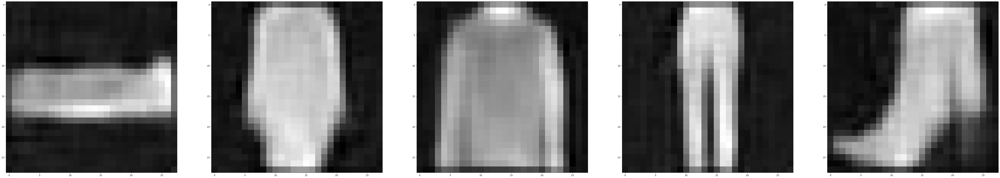

In [ ]:
preds = model.predict(X_test_n[n:n+5])
f, ax = plt.subplots(1,5)
f.set_size_inches(80, 40)
for i,a in enumerate(range(n,n+5)):
    ax[i].imshow(preds[i].reshape(28, 28), cmap='gray')
plt.show()

## Part 2: Variational Autoencoders (VAEs)

**Discussion: Why do we care to use VAEs? Identify the limitations/weaknesses of Autoencoders**

### Reset Data

In [ ]:
# get the data from keras - how convenient!
fashion_mnist = tf.keras.datasets.fashion_mnist

# load the data and split it into training and testing sets
(X_train, y_train),(X_test, y_test) = fashion_mnist.load_data()

# normalize the data by dividing with pixel intensity
# (each pixel is 8 bits so its value ranges from 0 to 255)
X_train, X_test = X_train / 255.0, X_test / 255.0

print(f'X_train shape: {X_train.shape}, X_test shape: {X_test.shape}')
print(f'y_train shape: {y_train.shape}, and y_test shape: {y_test.shape}')

X_train shape: (60000, 28, 28), X_test shape: (10000, 28, 28)
y_train shape: (60000,), and y_test shape: (10000,)


### Setup Encoder Neural Network

In [ ]:
batch_size = 16
latent_dim = 2  # Number of latent dimension parameters

input_img = tf.keras.layers.Input(shape=(784,), name="input")
x = tf.keras.layers.Dense(512, activation='relu', name="intermediate_encoder")(input_img)
x = tf.keras.layers.Dense(2, activation='relu', name="latent_encoder")(x)

z_mu = tf.keras.layers.Dense(latent_dim)(x)
z_log_sigma = tf.keras.layers.Dense(latent_dim)(x)

In [ ]:
# sampling function
def sampling(args):
    z_mu, z_log_sigma = args
    epsilon = tf.keras.backend.random_normal(shape=(tf.keras.backend.shape(z_mu)[0], latent_dim))
    z = z_mu + tf.keras.backend.exp(z_log_sigma) * epsilon
    return z

# sample vector from the latent distribution
z = tf.keras.layers.Lambda(sampling)([z_mu, z_log_sigma])

In [ ]:
# decoder takes the latent distribution sample as input
decoder_input = tf.keras.layers.Input((2,), name="input_decoder")

x = tf.keras.layers.Dense(512, activation='relu', name="intermediate_decoder", input_shape=(2,))(decoder_input)

# Expand to 784 total pixels
x = tf.keras.layers.Dense(784, activation='sigmoid', name="original_decoder")(x)

# decoder model statement
decoder = tf.keras.Model(decoder_input, x)

# apply the decoder to the sample from the latent distribution
z_decoded = decoder(z)

In [ ]:
decoder.summary()

Model: "model_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_decoder (InputLayer)  [(None, 2)]               0         
                                                                 
 intermediate_decoder (Dens  (None, 512)               1536      
 e)                                                              
                                                                 
 original_decoder (Dense)    (None, 784)               402192    
                                                                 
Total params: 403728 (1.54 MB)
Trainable params: 403728 (1.54 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
# construct a custom layer to calculate the loss
class CustomVariationalLayer(tf.keras.layers.Layer):

    def vae_loss(self, x, z_decoded):
        x = tf.keras.backend.flatten(x)
        z_decoded = tf.keras.backend.flatten(z_decoded)
        # Reconstruction loss
        xent_loss = tf.keras.losses.binary_crossentropy(x, z_decoded)
        return xent_loss

    # adds the custom loss to the class
    def call(self, inputs):
        x = inputs[0]
        z_decoded = inputs[1]
        loss = self.vae_loss(x, z_decoded)
        self.add_loss(loss, inputs=inputs)
        return x

# apply the custom loss to the input images and the decoded latent distribution sample
y = CustomVariationalLayer()([input_img, z_decoded])

In [ ]:
z_decoded

<KerasTensor: shape=(None, 784) dtype=float32 (created by layer 'model_1')>

In [ ]:
# VAE model statement
vae = tf.keras.Model(input_img, y)
vae.compile(optimizer='rmsprop', loss=None)

In [ ]:
vae.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input (InputLayer)          [(None, 784)]                0         []                            
                                                                                                  
 intermediate_encoder (Dens  (None, 512)                  401920    ['input[0][0]']               
 e)                                                                                               
                                                                                                  
 latent_encoder (Dense)      (None, 2)                    1026      ['intermediate_encoder[0][0]']
                                                                                                  
 dense (Dense)               (None, 2)                    6         ['latent_encoder[0][0]']

In [ ]:
X_train.shape

(60000, 28, 28)

In [ ]:
train_x = X_train.reshape(-1,784) # train_x.reshape(-1, 784)
val_x = X_test.reshape(-1,784) #val_x.reshape(-1, 784)

In [ ]:
vae.fit(x=train_x, y=None,
        shuffle=True,
        epochs=4,
        batch_size=batch_size,
        validation_data=(val_x, None))

Epoch 1/4
3750/3750 [==============================] - 24s 5ms/step - loss: 0.4431 - val_loss: 0.4158
Epoch 2/4
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3761 - val_loss: 0.3499
Epoch 3/4
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3451 - val_loss: 0.3433
Epoch 4/4
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3399 - val_loss: 0.3389


1/1 [==============================] - 0s 15ms/step


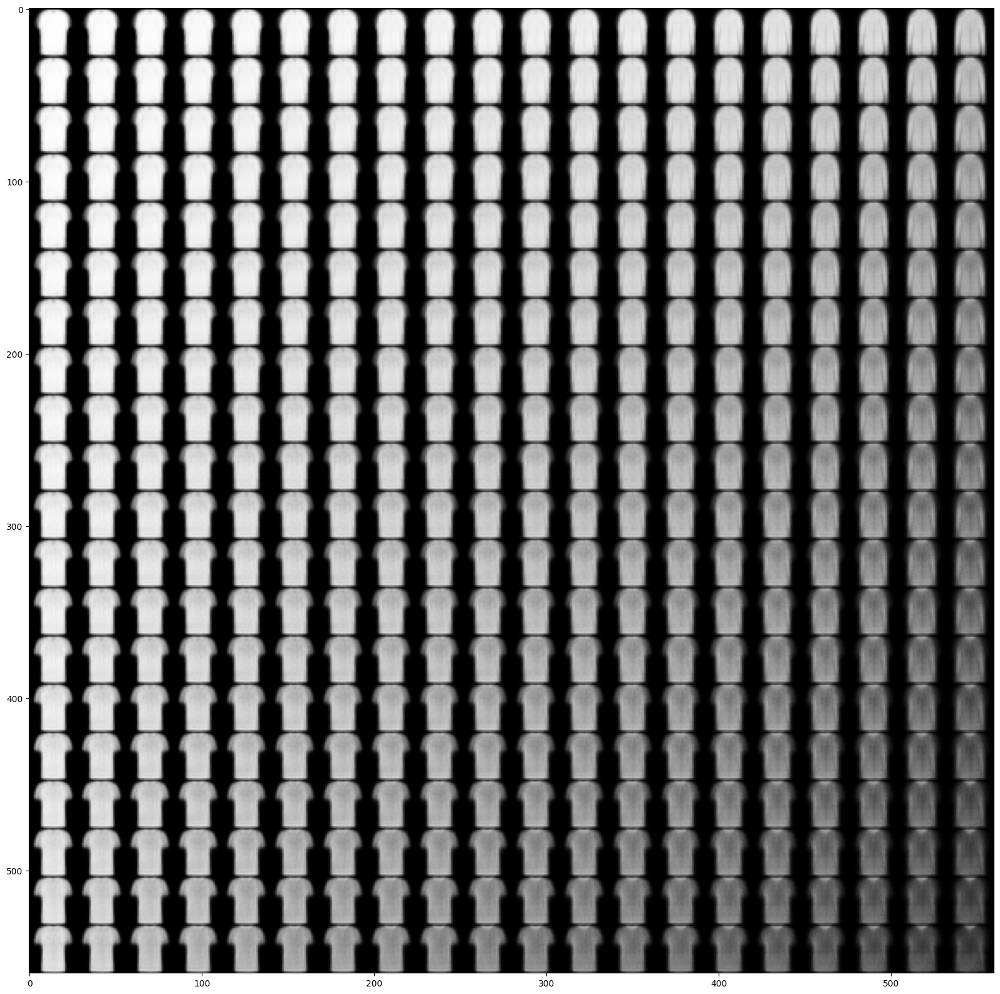

In [ ]:
# Display a 2D manifold of the samples
n = 20  # figure with 20x20 samples
digit_size = 28
figure = np.zeros((digit_size * n, digit_size * n))

# Construct grid of latent variable values - can change values here to generate different things
grid_x = norm.ppf(np.linspace(0.05, 0.95, n))
grid_y = norm.ppf(np.linspace(0.05, 0.95, n))

# decode for each square in the grid
for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
        z_sample = np.array([[xi, yi]])
        z_sample = np.tile(z_sample, batch_size).reshape(batch_size, 2)

        x_decoded = decoder.predict(z_sample, batch_size=batch_size)

        digit = x_decoded[0].reshape(digit_size, digit_size)

        figure[i * digit_size: (i + 1) * digit_size,
               j * digit_size: (j + 1) * digit_size] = digit

plt.figure(figsize=(20, 20))
plt.imshow(figure, cmap='gray')
plt.show()

3750/3750 [==============================] - 6s 2ms/step


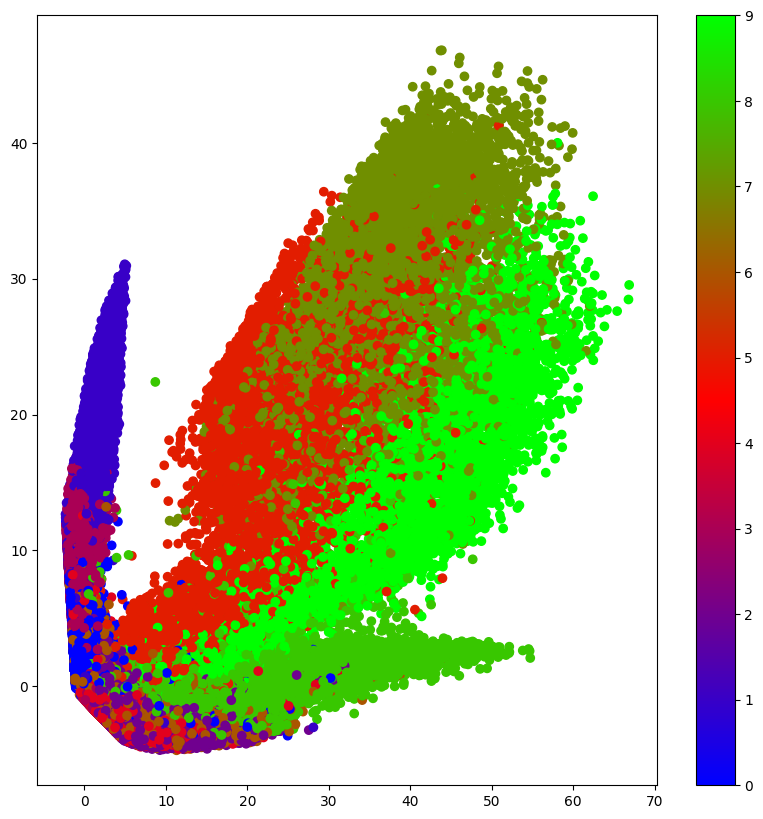

In [ ]:
# Translate into the latent space
encoder = tf.keras.Model(input_img, z_mu) # works on older version of TF and Keras
x_valid_noTest_encoded = encoder.predict(train_x, batch_size=batch_size)
plt.figure(figsize=(10, 10))
plt.scatter(x_valid_noTest_encoded[:, 0], x_valid_noTest_encoded[:, 1], c=y_train, cmap='brg')
plt.colorbar()
plt.show()

## Part 2B: Adding CNNs and KL Divergence Losses

### Generating new fashion

In [ ]:
batch_size = 16
latent_dim = 2  # Number of latent dimension parameters

# Encoder architecture: Input -> Conv2D*4 -> Flatten -> Dense
input_img = Input(shape=(28, 28, 1))

x = Conv2D(32,3,padding='same', activation='relu')(input_img)
x = Conv2D(64,3,padding='same', activation='relu',strides=(2, 2))(x)
x = Conv2D(64,3,padding='same', activation='relu')(x)
x = Conv2D(64,3,padding='same', activation='relu')(x)

# need to know the shape of the network here for the decoder
shape_before_flattening = K.int_shape(x)

x = Flatten()(x)
x = Dense(32, activation='relu')(x)

# Two outputs, latent mean and (log)variance
z_mu = Dense(latent_dim)(x)
z_log_sigma = Dense(latent_dim)(x)

### Setup Sampling Function

In [ ]:
# sampling function
def sampling(args):
    z_mu, z_log_sigma = args
    epsilon = K.random_normal(shape=(K.shape(z_mu)[0], latent_dim), mean=0., stddev=1.)
    return z_mu + K.exp(z_log_sigma) * epsilon

# sample vector from the latent distribution
z = Lambda(sampling)([z_mu, z_log_sigma])

### Setup Decoder Neural Network
Task: Try different number of hidden layers and nodes?

In [ ]:
# decoder takes the latent distribution sample as input
decoder_input = Input(K.int_shape(z)[1:])

# Expand to 784 total pixels
x = Dense(np.prod(shape_before_flattening[1:]),
                 activation='relu')(decoder_input)

# reshape
x = Reshape(shape_before_flattening[1:])(x)

# use Conv2DTranspose to reverse the conv layers from the encoder
x = Conv2DTranspose(32, 3,
                           padding='same',
                           activation='relu',
                           strides=(2, 2))(x)
x = Conv2D(1, 3,
                  padding='same',
                  activation='sigmoid')(x)

# decoder model statement
decoder = Model(decoder_input, x)

# apply the decoder to the sample from the latent distribution
z_decoded = decoder(z)

### Setup Loss Function

In [ ]:
# construct a custom layer to calculate the loss
class CustomVariationalLayer(Layer):

    def vae_loss(self, x, z_decoded):
        x = K.flatten(x)
        z_decoded = K.flatten(z_decoded)

        # Reconstruction loss
        xent_loss = tf.keras.losses.binary_crossentropy(x, z_decoded)

        # KL divergence
        kl_loss = -5e-4 * K.mean(1 + z_log_sigma - K.square(z_mu) - K.exp(z_log_sigma), axis=-1)
        return K.mean(xent_loss + kl_loss)

    # adds the custom loss to the class
    def call(self, inputs):
        x = inputs[0]
        z_decoded = inputs[1]
        loss = self.vae_loss(x, z_decoded)
        self.add_loss(loss, inputs=inputs)
        return x

# apply the custom loss to the input images and the decoded latent distribution sample
y = CustomVariationalLayer()([input_img, z_decoded])

### Train VAE

In [ ]:
# VAE model statement
vae = Model(input_img, y)
vae.compile(optimizer='rmsprop', loss=None)

In [ ]:
vae.summary()

Model: "model_20"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input (InputLayer)          [(None, 28, 28)]             0         []                            
                                                                                                  
 intermediate_encoder (Dens  (None, 28, 512)              14848     ['input[0][0]']               
 e)                                                                                               
                                                                                                  
 latent_encoder (Dense)      (None, 28, 2)                1026      ['intermediate_encoder[0][0]']
                                                                                                  
 dense_12 (Dense)            (None, 28, 2)                6         ['latent_encoder[0][0]'

In [ ]:
train_x = train_x.reshape(-1, 28, 28, 1)
val_x = val_x.reshape(-1, 28, 28, 1)

In [ ]:
vae.fit(x=train_x, y=None,
        shuffle=True,
        epochs=20,
        batch_size=batch_size,
        validation_data=(val_x, None))

Epoch 1/20
3750/3750 [==============================] - 15s 4ms/step - loss: 0.3655 - val_loss: 0.3654
Epoch 2/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3611 - val_loss: 0.3616
Epoch 3/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3559 - val_loss: 0.3532
Epoch 4/20
3750/3750 [==============================] - 15s 4ms/step - loss: 0.3506 - val_loss: 0.3523
Epoch 5/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3468 - val_loss: 0.3461
Epoch 6/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3431 - val_loss: 0.3430
Epoch 7/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3379 - val_loss: 0.3388
Epoch 8/20
3750/3750 [==============================] - 15s 4ms/step - loss: 0.3349 - val_loss: 0.3366
Epoch 9/20
3750/3750 [==============================] - 14s 4ms/step - loss: 0.3328 - val_loss: 0.3352
Epoch 10/20
3750/3750 [==============================] - 14s 4ms/step - l

### Visualize Samples Reconstructed by VAE

1/1 [==============================] - 0s 19ms/step


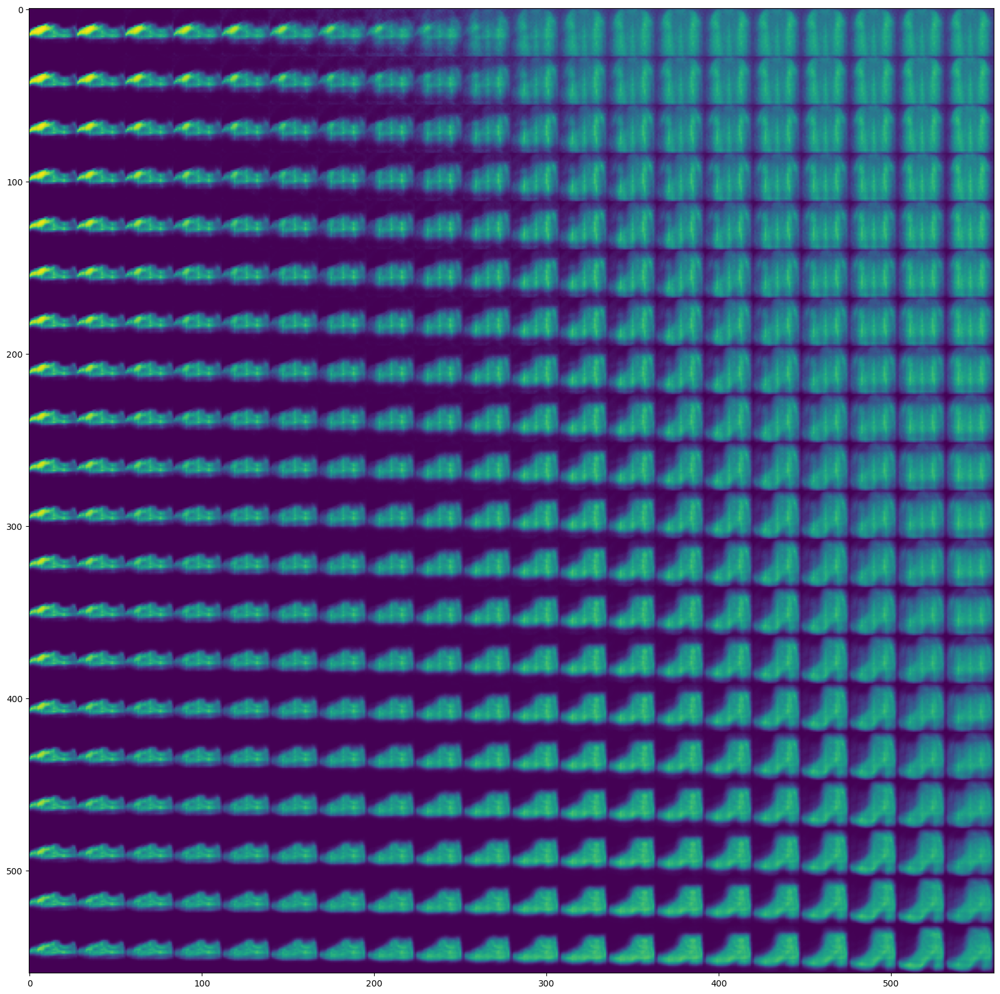

In [ ]:
# Display a 2D manifold of the samples
n = 20  # figure with 20x20 samples
digit_size = 28
figure = np.zeros((digit_size * n, digit_size * n))

# Construct grid of latent variable values - can change values here to generate different things
grid_x = norm.ppf(np.linspace(0.05, 0.95, n))
grid_y = norm.ppf(np.linspace(0.05, 0.95, n))

# decode for each square in the grid
for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
        z_sample = np.array([[xi, yi]])
        z_sample = np.tile(z_sample, batch_size).reshape(batch_size, 2)
        x_decoded = decoder.predict(z_sample, batch_size=batch_size)
        digit = x_decoded[0].reshape(digit_size, digit_size)
        figure[i * digit_size: (i + 1) * digit_size,
               j * digit_size: (j + 1) * digit_size] = digit

plt.figure(figsize=(20, 20))
plt.imshow(figure)
plt.show()

### VAE: Visualize Latent Space

3750/3750 [==============================] - 9s 2ms/step


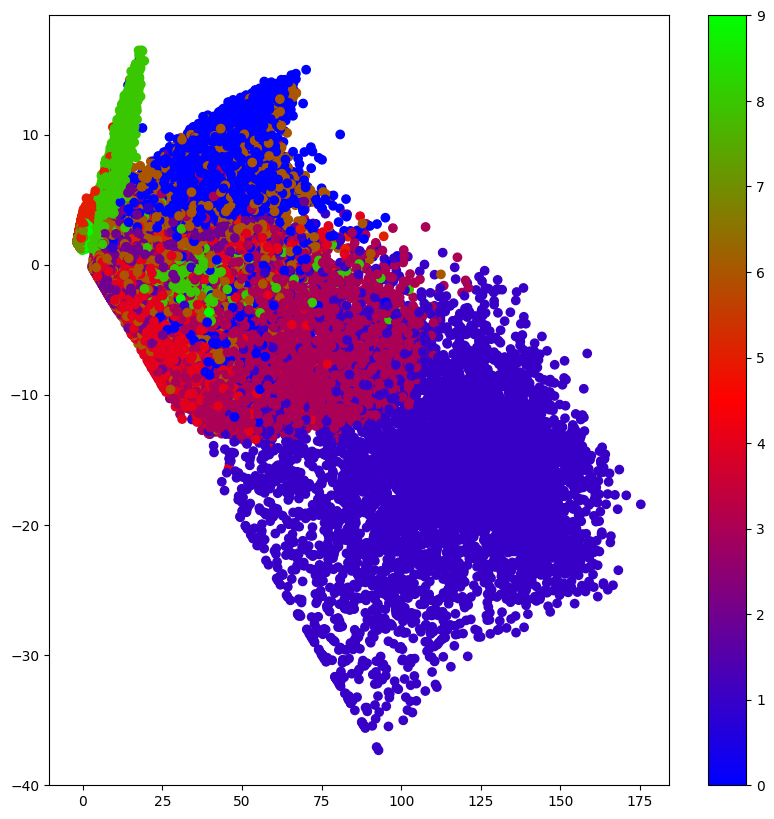

In [ ]:
# Translate into the latent space
encoder = Model(input_img, z_mu)
x_valid_noTest_encoded = encoder.predict(train_x, batch_size=batch_size)
plt.figure(figsize=(10, 10))
plt.scatter(x_valid_noTest_encoded[:, 0], x_valid_noTest_encoded[:, 1], c=y_train, cmap='brg')
plt.colorbar()
plt.show()

## Exercise: Generating a 1D Gaussian Distribution from Uniform Noise

In this exercise, we are going to generate 1-D Gaussian distribution from a n-D uniform distribution. This is a toy exercise in order to understand the ability of GANs (generators) to generate arbitrary distributions from random noise.

Generate training data - Gaussian Distribution

In [ ]:
# system libraries
import sys
import warnings
import os
import glob
warnings.filterwarnings("ignore")

# image libraries
import cv2 # requires installing opencv (e.g., pip install opencv-python)
from imgaug import augmenters # requires installing imgaug (e.g., pip install imgaug)

# math/numerical libraries
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
from scipy.stats import norm
from sklearn.model_selection import train_test_split

import tensorflow as tf

In [ ]:
def generate_data(n_samples = 10000,n_dim=1):
  return np.random.randn(n_samples, n_dim)

A general function to define feedforward architectures

In [ ]:
def set_model(input_dim, output_dim, hidden_dim=64,n_layers = 1,activation='tanh',optimizer='adam', loss = 'binary_crossentropy'):
  model = Sequential()
  model.add(Dense(hidden_dim,input_dim=input_dim,activation=activation))

  for _ in range(n_layers-1):
    model.add(Dense(hidden_dim),activation=activation)
  model.add(Dense(output_dim))

  model.compile(loss=loss, optimizer=optimizer)
  print(model.summary())
  return model

Setting GAN training and losses here

In [ ]:
def get_gan_network(discriminator, random_dim, generator, optimizer = 'adam'):
  discriminator.trainable = False
  gan_input = Input(shape=(random_dim,))
  x = generator(gan_input)
  gan_output = discriminator(x)
  gan = Model(inputs = gan_input,outputs=gan_output)
  gan.compile( loss='binary_crossentropy', optimizer=optimizer)
  return gan

In [ ]:
# hyper-parameters
NOISE_DIM = 10
DATA_DIM = 1
G_LAYERS = 1
D_LAYERS = 1

In [ ]:
def train_gan(epochs=1,batch_size=128):
    x_train = generate_data(n_samples=12800,n_dim=DATA_DIM)
    batch_count = x_train.shape[0]/batch_size

    generator = set_model(NOISE_DIM, DATA_DIM, n_layers=G_LAYERS, activation='tanh',loss = 'mean_squared_error')
    discriminator = set_model(DATA_DIM, 1, n_layers= D_LAYERS, activation='sigmoid')
    gan = get_gan_network(discriminator, NOISE_DIM, generator, 'adam')

    for e in range(1,epochs+1):

        # generate noise from a uniform distribution
        noise = np.random.rand(batch_size,NOISE_DIM)
        true_batch = x_train[np.random.choice(x_train.shape[0], batch_size, replace=False), :]

        generated_values = generator.predict(noise)
        X = np.concatenate([generated_values,true_batch])

        y_dis = np.zeros(2*batch_size)

        #One-sided label smoothing to avoid overconfidence. In GAN, if the discriminator depends on a small set of features to detect real images,
        #the generator may just produce these features only to exploit the discriminator.
        #The optimization may turn too greedy and produces no long term benefit.
        #To avoid the problem, we penalize the discriminator when the prediction for any real images go beyond 0.9 (D(real image)>0.9).
        y_dis[:batch_size] = 0.9

        discriminator.trainable = True
        disc_history = discriminator.train_on_batch(X, y_dis)
        discriminator.trainable = False

        # Train generator
        noise = np.random.rand(batch_size,NOISE_DIM)
        y_gen = np.zeros(batch_size)
        gan.train_on_batch(noise, y_gen)

    return generator, discriminator

In [ ]:
generator, discriminator = train_gan()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 64)                704       
                                                                 
 dense_7 (Dense)             (None, 1)                 65        
                                                                 
Total params: 769 (3.00 KB)
Trainable params: 769 (3.00 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 64)                128       
                                                                 
 dense_9 (Dense)             (None, 1)                 65        
                                                                 

313/313 [==============================] - 1s 1ms/step
1st order moment -  True :  0.0 , GAN : [0.]
2nd order moment -  True :  1.020243964946054 , GAN : [0.01591862]
3rd order moment -  True :  -0.011068063191140256 , GAN : [0.00010058]
4th order moment -  True :  3.0730263021068938 , GAN : [0.00069906]


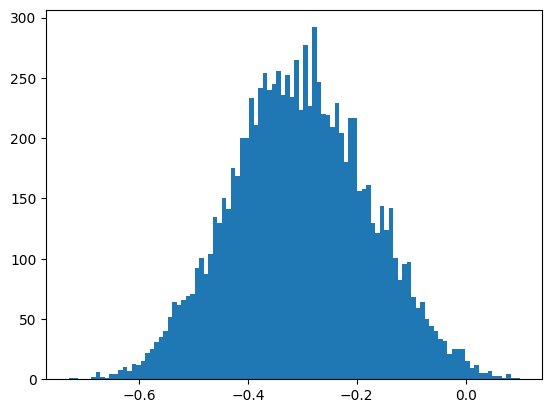

In [ ]:
noise = np.random.rand(10000,NOISE_DIM)
generated_values = generator.predict(noise)
plt.hist(generated_values,bins=100)

true_gaussian = [np.random.randn() for x in range(10000)]

print('1st order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 1) , ', GAN :', scipy.stats.moment(generated_values,1))
print('2nd order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 2) , ', GAN :', scipy.stats.moment(generated_values,2))
print('3rd order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 3) , ', GAN :', scipy.stats.moment(generated_values,3))
print('4th order moment - ', 'True : ', scipy.stats.moment(true_gaussian, 4) , ', GAN :', scipy.stats.moment(generated_values,4))
plt.show()

**CONCLUSION**

Some conclusions we can make from this exercise:
1. GANs are able to learn a generative model from general noise distributions.
2. Traditional GANs do not learn the higher-order moments well. Possible issues : Number of samples, approximating higher moments is hard. Usually known to under-predict higher order variances. For people interested in learning why, read more about divergence measures between distributions (particularly about Wasserstein etc.)


# Supplementary Activities

## Part 1: MNIST GAN - Learn to Generate MNIST Digits

In [ ]:
from keras.datasets import mnist
#from keras.utils import np_utils
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten
from keras.layers import LeakyReLU
from keras.optimizers import RMSprop
from keras.optimizers.legacy import Adam
import numpy as np
import matplotlib.pyplot as plt
import random
from tqdm import tqdm_notebook
import warnings
warnings.filterwarnings("ignore")
# Dataset of 60,000 28x28 grayscale images of the 10 digits, along with a test set of 10,000 images.
(X_train, Y_train), (X_test, Y_test) = mnist.load_data()

11490434/11490434 [==============================] - 2s 0us/step


Re-scale data since we are using ReLU activations. **WHY?**

In [ ]:
X_train = X_train.reshape(60000, 784)
X_test = X_test.reshape(10000, 784)
X_train = X_train.astype('float32')/255
X_test = X_test.astype('float32')/255

Set noise dimension

**EXERCISE : Play around with different noise dimensions and plot the performance with respect to the size of the noise vector.**

In [ ]:
z_dim = 10

Tasks:
1. Build Model using LeakyReLU Activations: Build a generator, discriminator, and a GAN as feed-forward network with multiple layers, dropout, and leakyReLU as activation function.
2. Train Model
3. Provide an evaluation/conclusion.

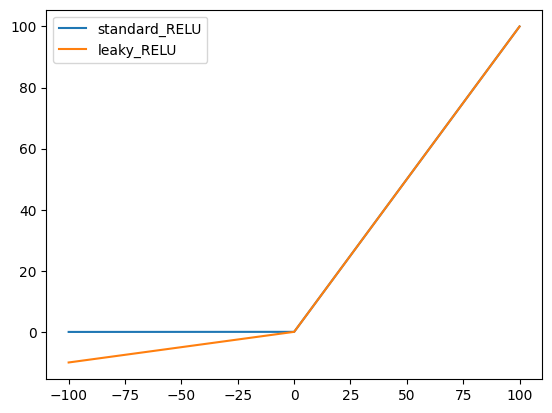

In [ ]:
def leakyReLU(x,neg_scale=0.01):
    if x > 0:
        return x
    else:
        return neg_scale*x

std_relu = []
leaky_relu = []

std_relu = [leakyReLU(x,neg_scale=0) for x in np.linspace(-100,100,10000)]
leaky_relu = [leakyReLU(x,neg_scale=0.1) for x in np.linspace(-100,100,10000)]

plt.plot(np.linspace(-100,100,10000),std_relu, label='standard_RELU')
plt.plot(np.linspace(-100,100,10000),leaky_relu, label='leaky_RELU')
plt.legend()
plt.show()

In [ ]:
adam = Adam(learning_rate=0.0002, beta_1=0.5)


# (a) GENERATOR
g = Sequential()
g.add(Dense(256, input_dim=z_dim, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(512, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(1024, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(784, activation='sigmoid'))  # Values between 0 and 1
g.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (b) DISCRIMINATOR
d = Sequential()
d.add(Dense(1024, input_dim=784, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(512, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(256, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(1, activation='sigmoid'))  # Values between 0 and 1
d.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (c) GAN
d.trainable = False
inputs = Input(shape=(z_dim, ))
hidden = g(inputs)
output = d(hidden)
gan = Model(inputs, output)
gan.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

def plot_loss(losses):
    """
    @losses.keys():
        0: loss
        1: accuracy
    """
    d_loss = [v[0] for v in losses["D"]]
    g_loss = [v[0] for v in losses["G"]]

    plt.figure(figsize=(10,8))
    plt.plot(d_loss, label="Discriminator loss")
    plt.plot(g_loss, label="Generator loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def plot_generated(n_ex=10, dim=(1, 10), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, z_dim))
    generated_images = g.predict(noise)
    generated_images = generated_images.reshape(n_ex, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()

In [ ]:
losses = {"D":[], "G":[]}

def train(epochs=1, plt_frq=1, BATCH_SIZE=128):
    batchCount = int(X_train.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchCount)

    for e in tqdm_notebook(range(1, epochs+1)):
        if e == 1 or e%plt_frq == 0:
            print('-'*15, 'Epoch %d' % e, '-'*15)

        for _ in range(batchCount):  # tqdm_notebook(range(batchCount), leave=False):
            # Create a batch by drawing random index numbers from the training set
            image_batch = X_train[np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)]
            # Create noise vectors for the generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))

            # Generate the images from the noise
            generated_images = g.predict(noise)
            X = np.concatenate((image_batch, generated_images))
            # Create labels
            y = np.zeros(2*BATCH_SIZE)
            y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

            # Train discriminator on generated images
            d.trainable = True
            d_loss = d.train_on_batch(X, y)

            # Train generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))
            y2 = np.ones(BATCH_SIZE)
            d.trainable = False
            g_loss = gan.train_on_batch(noise, y2)

        # Only store losses from final
        losses["D"].append(d_loss)
        losses["G"].append(g_loss)

        # Update the plots
        if e == 1 or e%plt_frq == 0:
            plot_generated()
    plot_loss(losses)

Epochs: 100
Batch size: 256
Batches per epoch: 234


  0%|          | 0/100 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 17ms/step


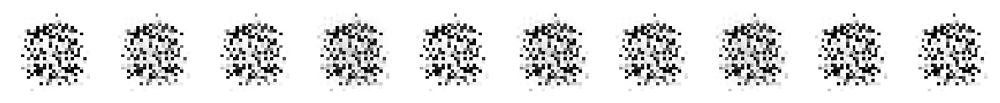

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 5 ---------------
1/1 [==============================] - 0s 17ms/step


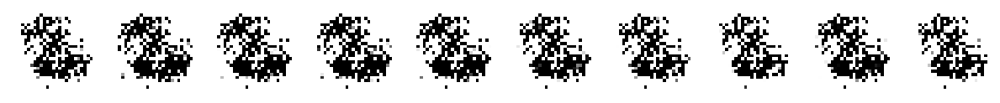

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 10 ---------------
1/1 [==============================] - 0s 34ms/step


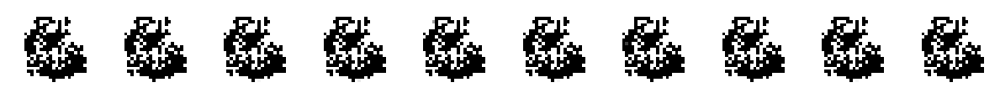

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 15 ---------------
1/1 [==============================] - 0s 22ms/step


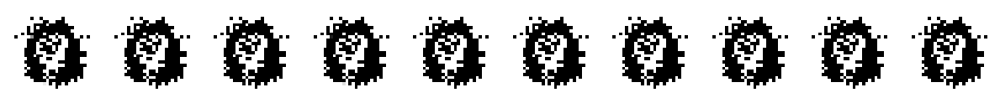

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 20ms/step


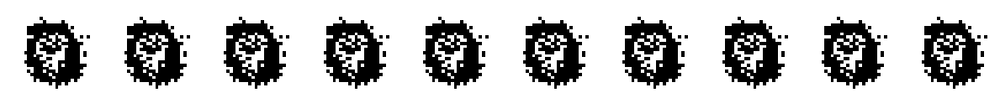

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 25 ---------------
1/1 [==============================] - 0s 17ms/step


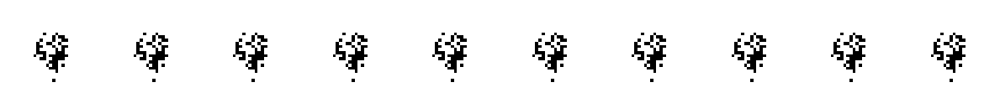

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 30 ---------------
1/1 [==============================] - 0s 17ms/step


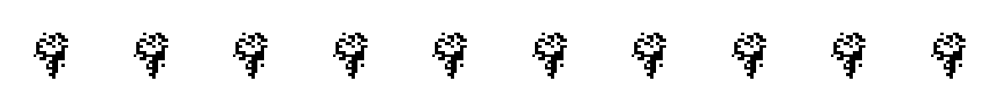

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 35 ---------------
1/1 [==============================] - 0s 19ms/step


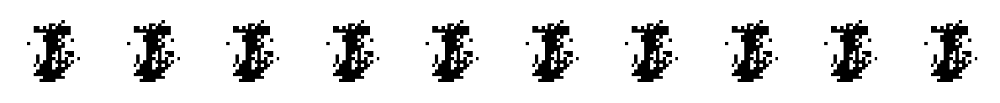

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 18ms/step


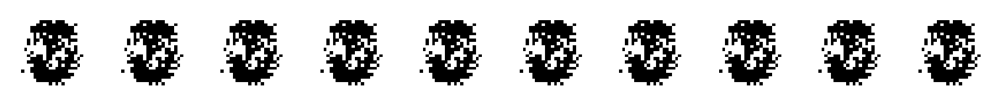

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 45 ---------------
1/1 [==============================] - 0s 20ms/step


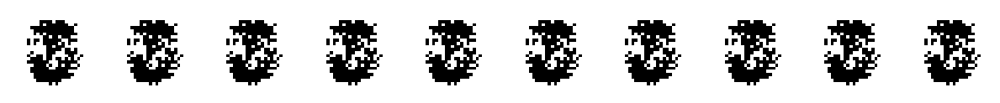

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 50 ---------------
1/1 [==============================] - 0s 17ms/step


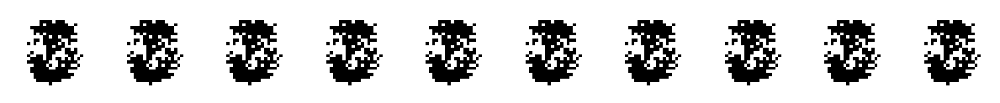

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 55 ---------------
1/1 [==============================] - 0s 21ms/step


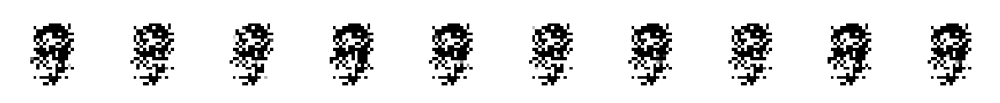

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 60 ---------------
1/1 [==============================] - 0s 20ms/step


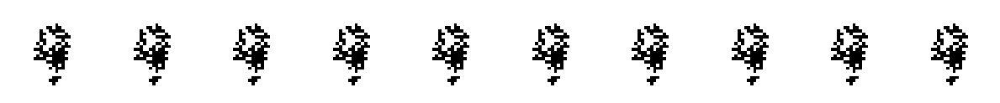

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 65 ---------------
1/1 [==============================] - 0s 22ms/step


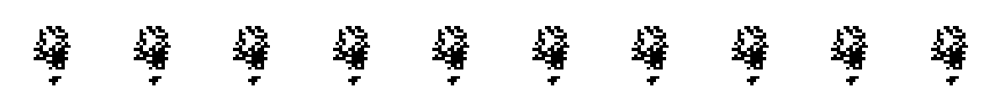

8/8 [==============================] - 0s 3ms/step
--------------- Epoch 70 ---------------
1/1 [==============================] - 0s 16ms/step


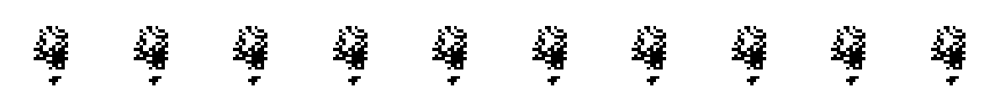

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 75 ---------------
1/1 [==============================] - 0s 21ms/step


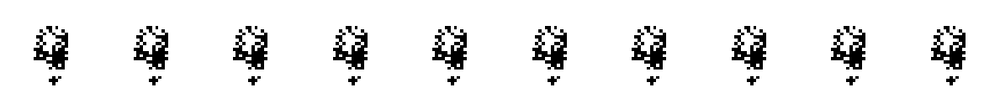

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 80 ---------------
1/1 [==============================] - 0s 31ms/step


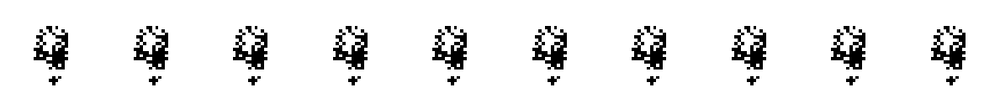

8/8 [==============================] - 0s 3ms/step
--------------- Epoch 85 ---------------
1/1 [==============================] - 0s 17ms/step


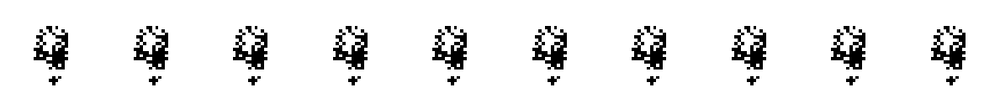

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 90 ---------------
1/1 [==============================] - 0s 24ms/step


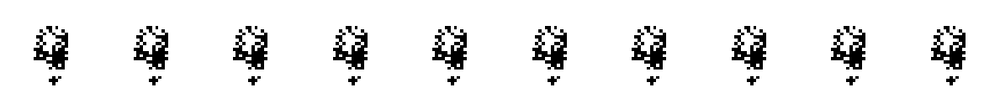

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 95 ---------------
1/1 [==============================] - 0s 28ms/step


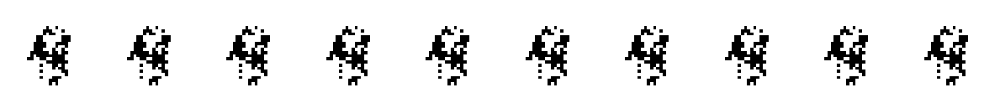

8/8 [==============================] - 0s 2ms/step
--------------- Epoch 100 ---------------
1/1 [==============================] - 0s 19ms/step


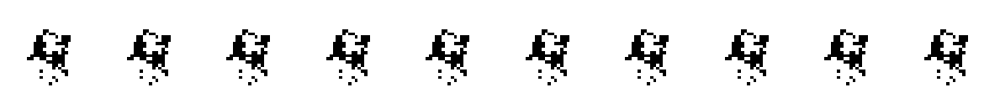

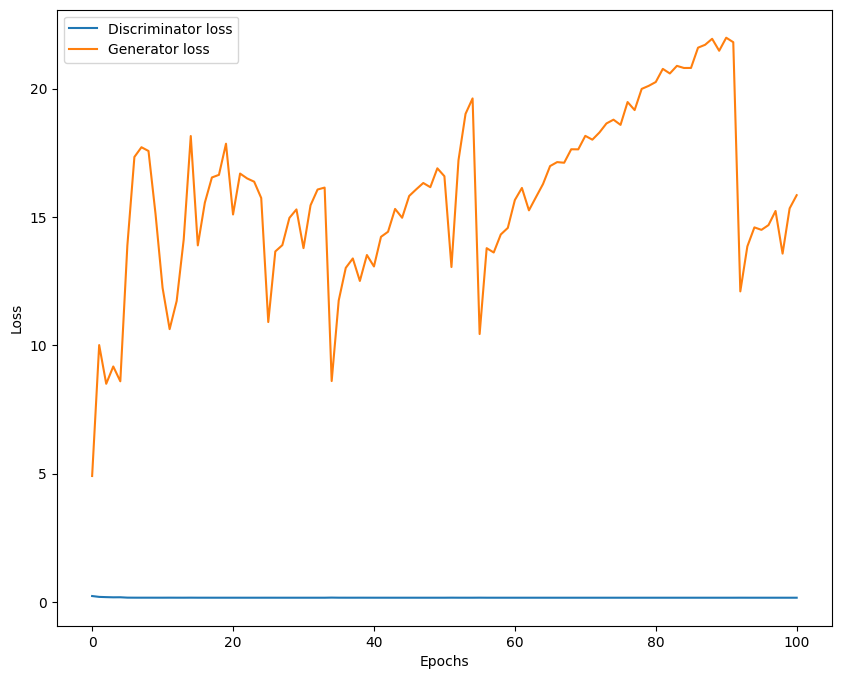

In [ ]:
train(epochs=100, BATCH_SIZE=256)

z_dim = 10000

In [ ]:
z_dim = 10000
adam = Adam(learning_rate=0.0002, beta_1=0.5)


# (a) GENERATOR
g = Sequential()
g.add(Dense(256, input_dim=z_dim, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(512, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(1024, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(784, activation='sigmoid'))  # Values between 0 and 1
g.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (b) DISCRIMINATOR
d = Sequential()
d.add(Dense(1024, input_dim=784, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(512, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(256, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(1, activation='sigmoid'))  # Values between 0 and 1
d.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (c) GAN
d.trainable = False
inputs = Input(shape=(z_dim, ))
hidden = g(inputs)
output = d(hidden)
gan = Model(inputs, output)
gan.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

def plot_loss(losses):
    """
    @losses.keys():
        0: loss
        1: accuracy
    """
    d_loss = [v[0] for v in losses["D"]]
    g_loss = [v[0] for v in losses["G"]]

    plt.figure(figsize=(10,8))
    plt.plot(d_loss, label="Discriminator loss")
    plt.plot(g_loss, label="Generator loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def plot_generated(z_dim, n_ex=10, dim=(1, 10), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, z_dim))
    generated_images = g.predict(noise)
    generated_images = generated_images.reshape(n_ex, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


losses = {"D":[], "G":[]}

def train(z_dim, epochs=1, plt_frq=1, BATCH_SIZE=128):
    batchCount = int(X_train.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchCount)

    for e in tqdm_notebook(range(1, epochs+1)):
        if e == 1 or e%plt_frq == 0:
            print('-'*15, 'Epoch %d' % e, '-'*15)

        for _ in range(batchCount):  # tqdm_notebook(range(batchCount), leave=False):
            # Create a batch by drawing random index numbers from the training set
            image_batch = X_train[np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)]
            # Create noise vectors for the generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))

            # Generate the images from the noise
            generated_images = g.predict(noise)
            X = np.concatenate((image_batch, generated_images))
            # Create labels
            y = np.zeros(2*BATCH_SIZE)
            y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

            # Train discriminator on generated images
            d.trainable = True
            d_loss = d.train_on_batch(X, y)

            # Train generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))
            y2 = np.ones(BATCH_SIZE)
            d.trainable = False
            g_loss = gan.train_on_batch(noise, y2)

        # Only store losses from final
        losses["D"].append(d_loss)
        losses["G"].append(g_loss)

        # Update the plots
        if e == 1 or e%plt_frq == 0:
            plot_generated(z_dim)
    plot_loss(losses)

Epochs: 50
Batch size: 256
Batches per epoch: 234


  0%|          | 0/50 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 80ms/step


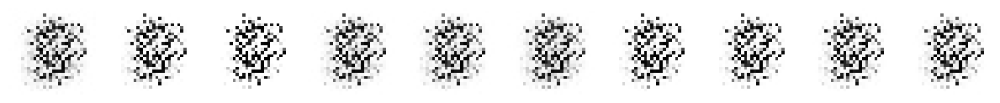

--------------- Epoch 2 ---------------
1/1 [==============================] - 0s 17ms/step


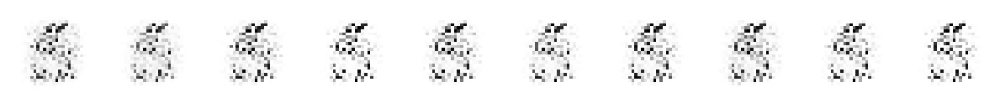

--------------- Epoch 3 ---------------
1/1 [==============================] - 0s 30ms/step


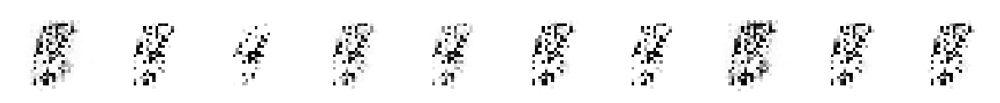

--------------- Epoch 4 ---------------
1/1 [==============================] - 0s 28ms/step


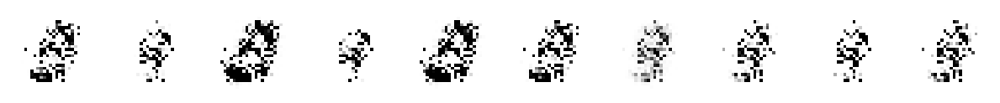

--------------- Epoch 5 ---------------
1/1 [==============================] - 0s 20ms/step


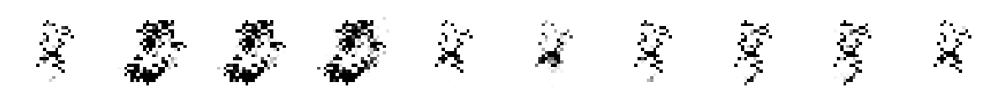

--------------- Epoch 6 ---------------
1/1 [==============================] - 0s 18ms/step


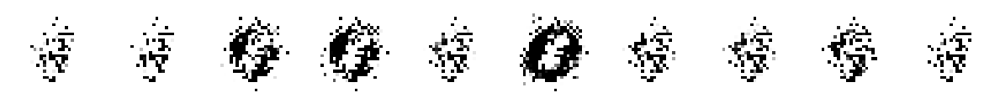

--------------- Epoch 7 ---------------
1/1 [==============================] - 0s 20ms/step


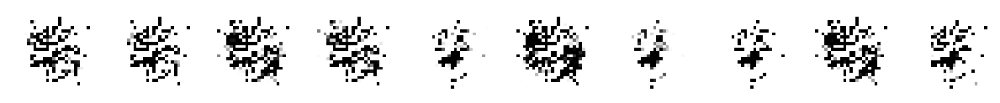

--------------- Epoch 8 ---------------
1/1 [==============================] - 0s 17ms/step


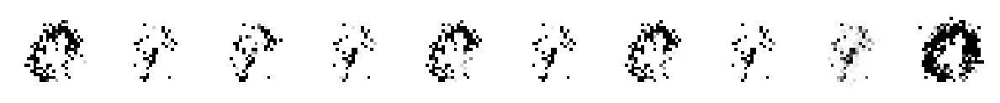

--------------- Epoch 9 ---------------
1/1 [==============================] - 0s 17ms/step


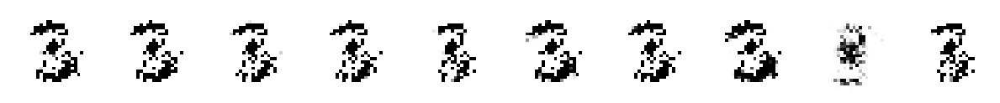

--------------- Epoch 10 ---------------
1/1 [==============================] - 0s 18ms/step


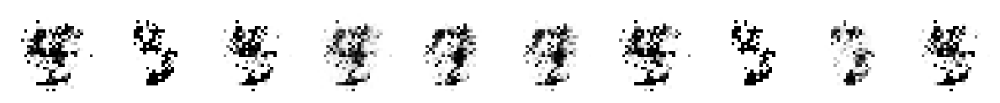

--------------- Epoch 11 ---------------
1/1 [==============================] - 0s 25ms/step


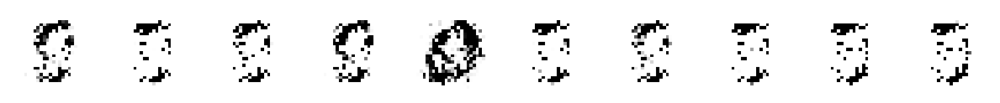

--------------- Epoch 12 ---------------
1/1 [==============================] - 0s 18ms/step


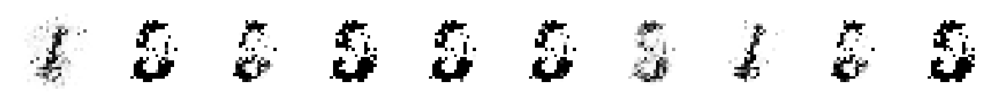

--------------- Epoch 13 ---------------
1/1 [==============================] - 0s 17ms/step


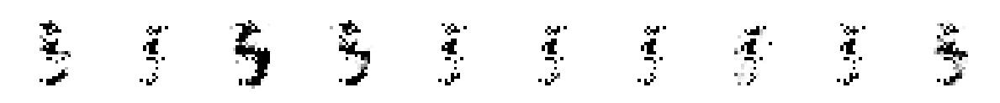

--------------- Epoch 14 ---------------
1/1 [==============================] - 0s 17ms/step


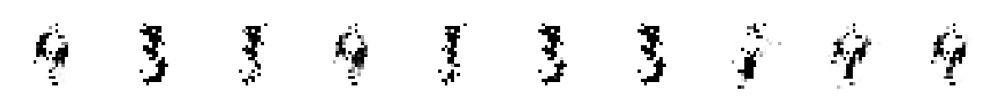

--------------- Epoch 15 ---------------
1/1 [==============================] - 0s 28ms/step


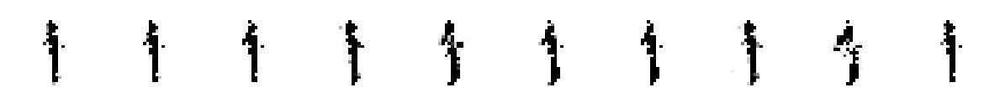

--------------- Epoch 16 ---------------
1/1 [==============================] - 0s 19ms/step


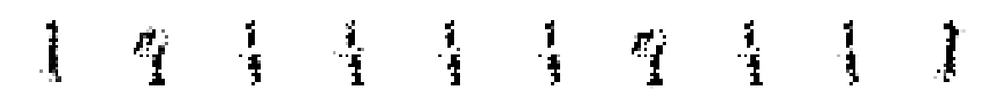

--------------- Epoch 17 ---------------
1/1 [==============================] - 0s 18ms/step


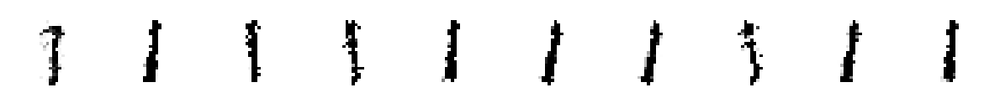

--------------- Epoch 18 ---------------
1/1 [==============================] - 0s 19ms/step


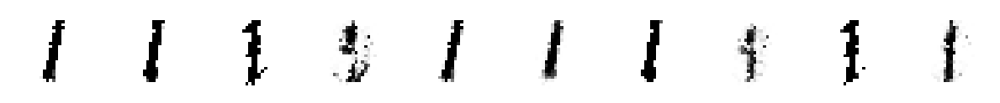

--------------- Epoch 19 ---------------
1/1 [==============================] - 0s 18ms/step


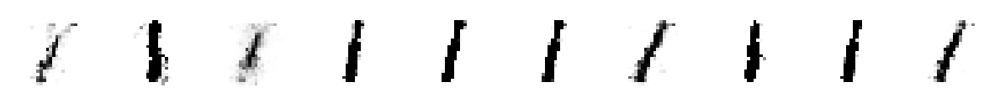

--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 19ms/step


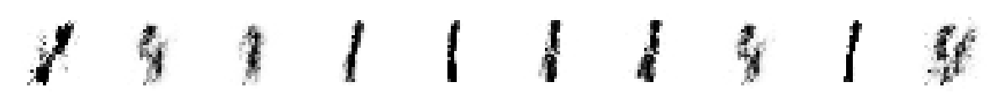

--------------- Epoch 21 ---------------
1/1 [==============================] - 0s 19ms/step


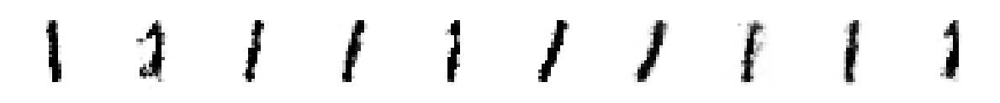

--------------- Epoch 22 ---------------
1/1 [==============================] - 0s 18ms/step


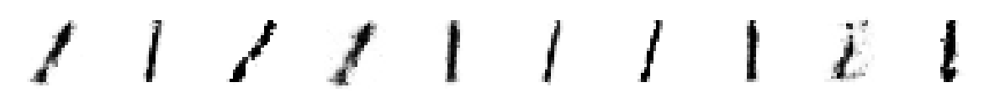

--------------- Epoch 23 ---------------
1/1 [==============================] - 0s 20ms/step


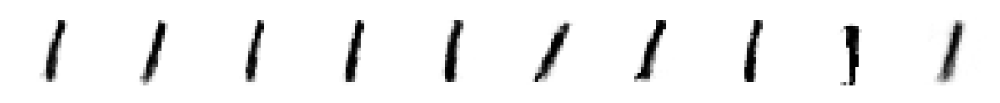

--------------- Epoch 24 ---------------
1/1 [==============================] - 0s 19ms/step


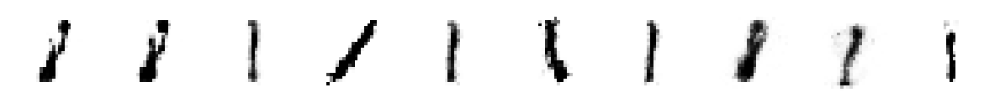

--------------- Epoch 25 ---------------
1/1 [==============================] - 0s 23ms/step


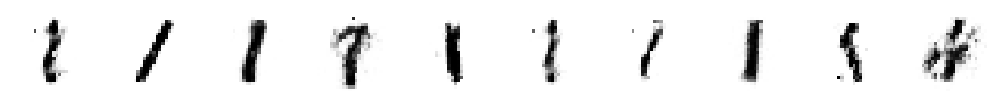

--------------- Epoch 26 ---------------
1/1 [==============================] - 0s 18ms/step


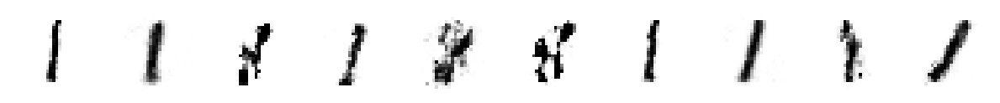

--------------- Epoch 27 ---------------
1/1 [==============================] - 0s 18ms/step


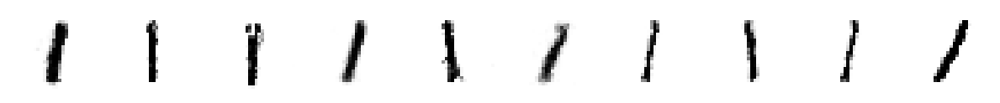

--------------- Epoch 28 ---------------
1/1 [==============================] - 0s 34ms/step


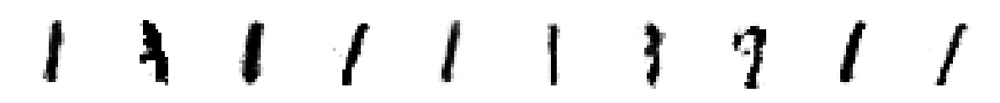

--------------- Epoch 29 ---------------
1/1 [==============================] - 0s 18ms/step


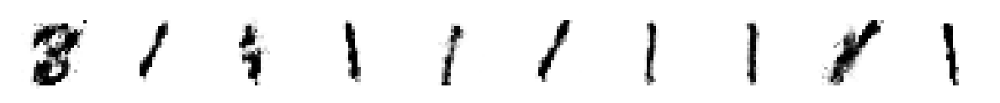

--------------- Epoch 30 ---------------
1/1 [==============================] - 0s 17ms/step


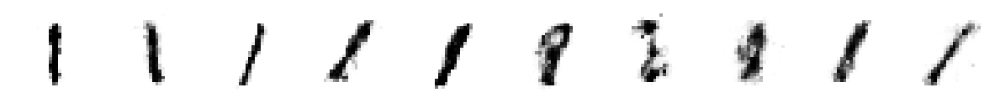

--------------- Epoch 31 ---------------
1/1 [==============================] - 0s 19ms/step


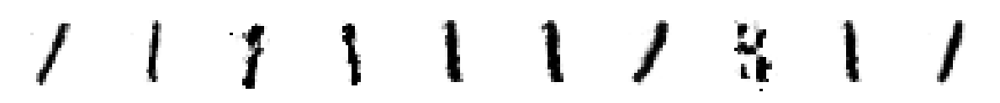

--------------- Epoch 32 ---------------
1/1 [==============================] - 0s 17ms/step


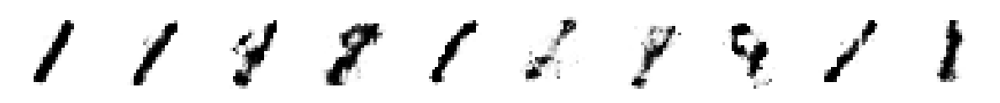

--------------- Epoch 33 ---------------
1/1 [==============================] - 0s 17ms/step


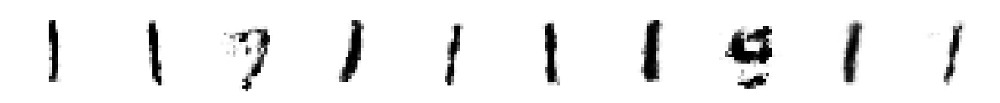

--------------- Epoch 34 ---------------
1/1 [==============================] - 0s 17ms/step


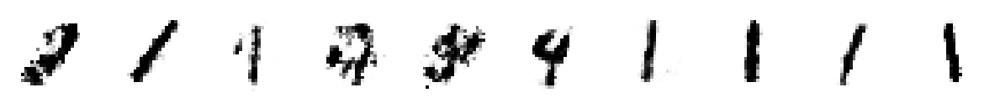

--------------- Epoch 35 ---------------
1/1 [==============================] - 0s 26ms/step


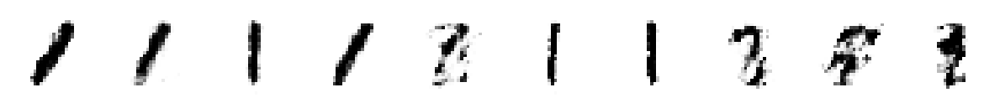

--------------- Epoch 36 ---------------
1/1 [==============================] - 0s 17ms/step


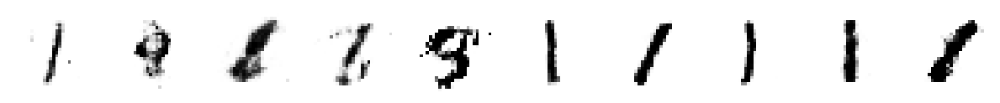

--------------- Epoch 37 ---------------
1/1 [==============================] - 0s 25ms/step


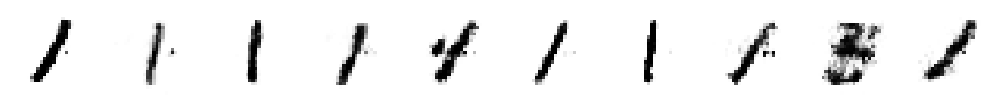

--------------- Epoch 38 ---------------
1/1 [==============================] - 0s 16ms/step


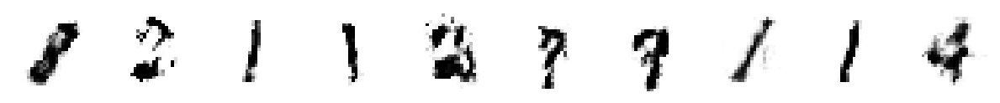

--------------- Epoch 39 ---------------
1/1 [==============================] - 0s 17ms/step


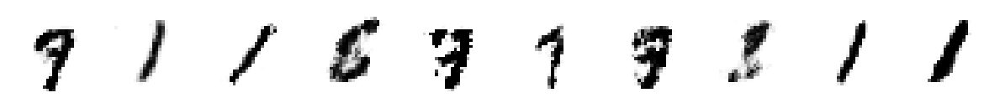

--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 17ms/step


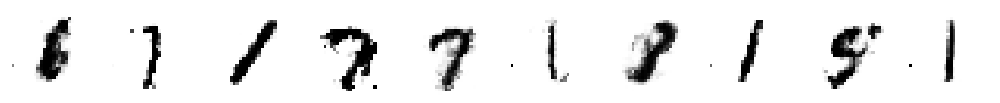

--------------- Epoch 41 ---------------
1/1 [==============================] - 0s 19ms/step


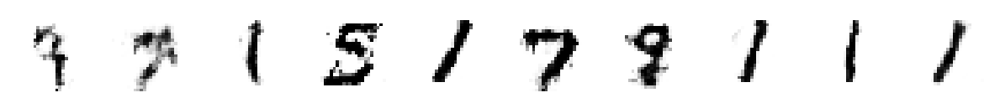

--------------- Epoch 42 ---------------
1/1 [==============================] - 0s 19ms/step


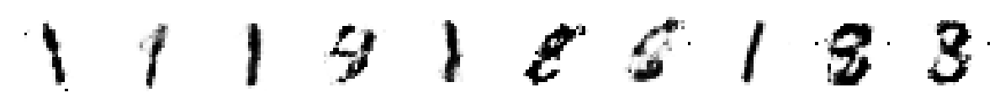

--------------- Epoch 43 ---------------
1/1 [==============================] - 0s 16ms/step


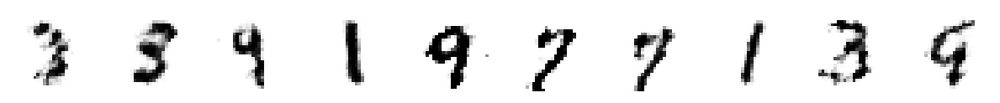

--------------- Epoch 44 ---------------
1/1 [==============================] - 0s 17ms/step


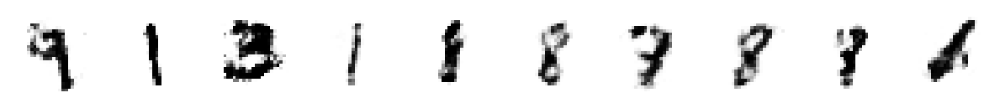

--------------- Epoch 45 ---------------
1/1 [==============================] - 0s 18ms/step


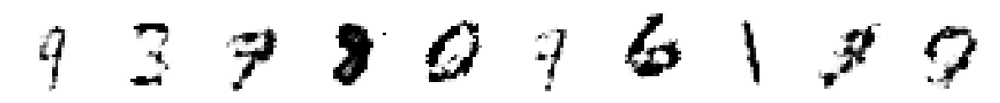

--------------- Epoch 46 ---------------
1/1 [==============================] - 0s 18ms/step


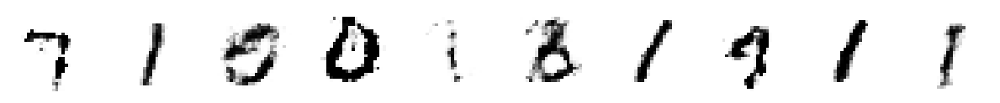

--------------- Epoch 47 ---------------
1/1 [==============================] - 0s 17ms/step


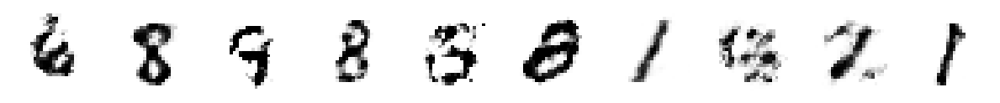

--------------- Epoch 48 ---------------
1/1 [==============================] - 0s 26ms/step


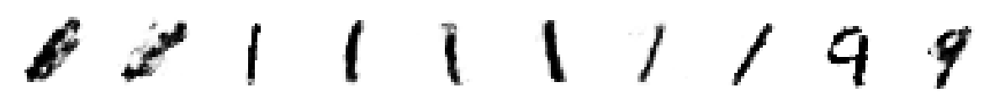

--------------- Epoch 49 ---------------
1/1 [==============================] - 0s 17ms/step


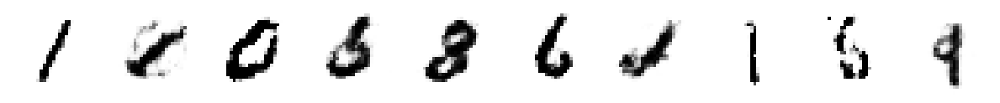

--------------- Epoch 50 ---------------
1/1 [==============================] - 0s 17ms/step


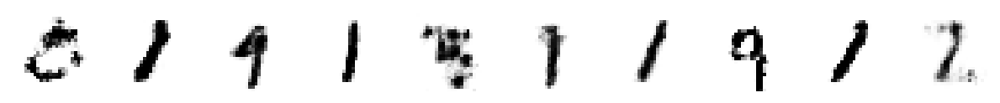

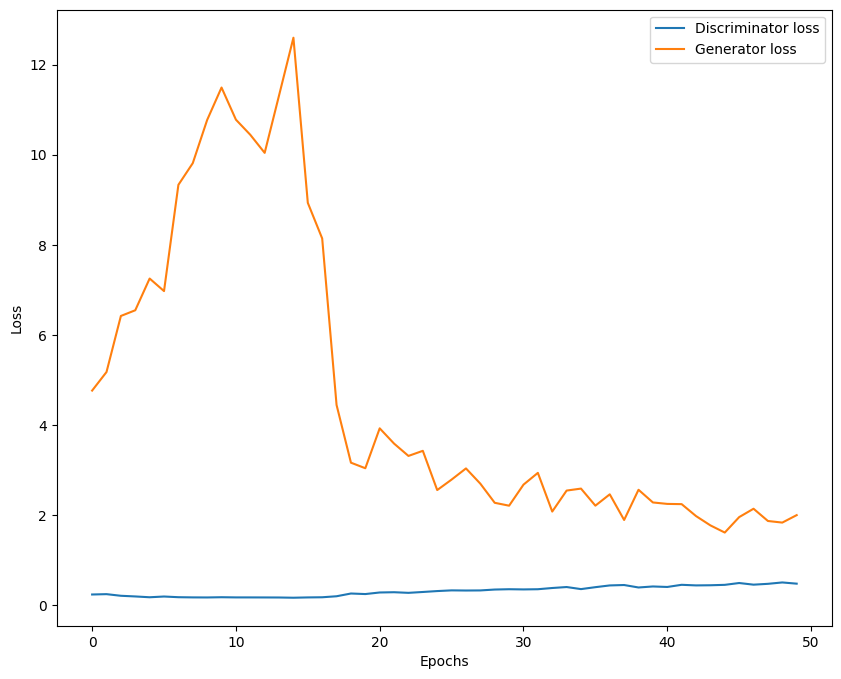

In [ ]:
train(z_dim, epochs=50, BATCH_SIZE=256)

## Part 2: GANs and VAEs

Tasks:
1. Use your own dataset.
2. Generate new images using GAN and VAE
3. Compare the results of generating images using GAN and VAE.

### Dataset

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
csv_path = '/content/drive/MyDrive/Colab Notebooks/arithmetic.csv'
df = pd.read_csv(csv_path)
print(df.shape)
df.head()

(3080, 785)


,label,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
0,add,255,255,255,255,255,255,255,255,255,...,90,255,255,255,255,255,255,255,255,255
1,add,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
2,add,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
3,add,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
4,add,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255


In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['label'])
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("Label mapping:")
print(label_mapping)

Label mapping:
{'add': 0, 'div': 1, 'eq': 2, 'mul': 3, 'sub': 4}


In [ ]:
print(df.label.value_counts())
df.head()

label
4    655
2    634
1    618
0    596
3    577
Name: count, dtype: int64


,label,pixel_0,pixel_1,pixel_2,pixel_3,pixel_4,pixel_5,pixel_6,pixel_7,pixel_8,...,pixel_774,pixel_775,pixel_776,pixel_777,pixel_778,pixel_779,pixel_780,pixel_781,pixel_782,pixel_783
0,0,255,255,255,255,255,255,255,255,255,...,90,255,255,255,255,255,255,255,255,255
1,0,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
2,0,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
3,0,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255
4,0,255,255,255,255,255,255,255,255,255,...,255,255,255,255,255,255,255,255,255,255


In [ ]:
from sklearn.model_selection import train_test_split

X = df.drop(columns=['label']).values
y = df['label'].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
print("Training set - X shape:", X_train.shape, "y shape:", y_train.shape)
print("Testing set - X shape:", X_test.shape, "y shape:", y_test.shape)

Training set - X shape: (2156, 784) y shape: (2156,)
Testing set - X shape: (924, 784) y shape: (924,)


In [ ]:
X_train = X_train.astype('float32')/255
X_test = X_test.astype('float32')/255

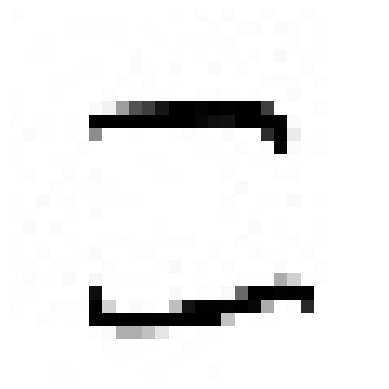

In [ ]:
import matplotlib.pyplot as plt
index = 0
selected_image = X_train[index].reshape(28,28)

plt.imshow(selected_image, cmap='gray')
plt.axis('off')
plt.show()

### GAN

In [ ]:
from keras.datasets import mnist
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Dropout, Activation, Flatten, BatchNormalization
from keras.layers import LeakyReLU
from keras.optimizers import RMSprop
from keras.optimizers.legacy import Adam
import numpy as np
import matplotlib.pyplot as plt
import random
from tqdm import tqdm_notebook
import warnings
warnings.filterwarnings("ignore")

In [ ]:
z_dim = 1
adam = Adam(learning_rate=0.0005, beta_1=0.5)


# (a) GENERATOR
g = Sequential()
g.add(Dense(128, input_dim=z_dim, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(256, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(512, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(784, activation='sigmoid'))  # Values between 0 and 1
g.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (b) DISCRIMINATOR
d = Sequential()
d.add(Dense(512, input_dim=784, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(254, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(128, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(1, activation='sigmoid'))  # Values between 0 and 1
d.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (c) GAN
d.trainable = False
inputs = Input(shape=(z_dim, ))
hidden = g(inputs)
output = d(hidden)
gan = Model(inputs, output)
gan.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

def plot_loss(losses):
    """
    @losses.keys():
        0: loss
        1: accuracy
    """
    d_loss = [v[0] for v in losses["D"]]
    g_loss = [v[0] for v in losses["G"]]

    plt.figure(figsize=(10,8))
    plt.plot(d_loss, label="Discriminator loss")
    plt.plot(g_loss, label="Generator loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def plot_generated(z_dim, n_ex=5, dim=(1, 5), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, z_dim))
    generated_images = g.predict(noise)
    generated_images = generated_images.reshape(n_ex, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


losses = {"D":[], "G":[]}

def train(z_dim, epochs=1, plt_frq=1, BATCH_SIZE=128):
    batchCount = int(X_train.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchCount)

    for e in tqdm_notebook(range(1, epochs+1)):
        if e == 1 or e%plt_frq == 0:
            print('-'*15, 'Epoch %d' % e, '-'*15)

        for _ in range(batchCount):  # tqdm_notebook(range(batchCount), leave=False):
            # Create a batch by drawing random index numbers from the training set
            image_batch = X_train[np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)]
            # Create noise vectors for the generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))

            # Generate the images from the noise
            generated_images = g.predict(noise)
            X = np.concatenate((image_batch, generated_images))
            # Create labels
            y = np.zeros(2*BATCH_SIZE)
            y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

            # Train discriminator on generated images
            d.trainable = True
            d_loss = d.train_on_batch(X, y)

            # Train generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))
            y2 = np.ones(BATCH_SIZE)
            d.trainable = False
            g_loss = gan.train_on_batch(noise, y2)

        # Only store losses from final
        losses["D"].append(d_loss)
        losses["G"].append(g_loss)

        # Update the plots
        if e == 1 or e%plt_frq == 0:
            plot_generated(z_dim)
    plot_loss(losses)

Epochs: 50
Batch size: 64
Batches per epoch: 33


  0%|          | 0/50 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 64ms/step


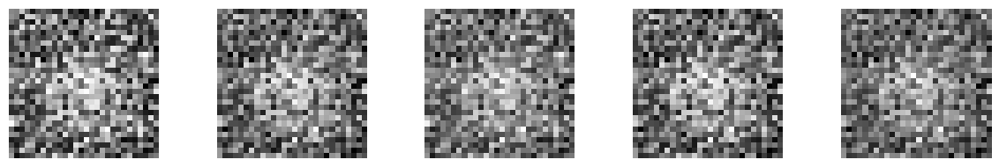

--------------- Epoch 2 ---------------
1/1 [==============================] - 0s 30ms/step


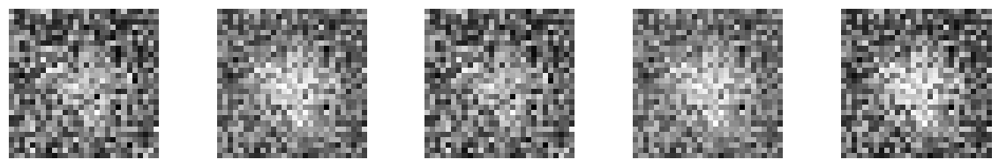

--------------- Epoch 3 ---------------
1/1 [==============================] - 0s 18ms/step


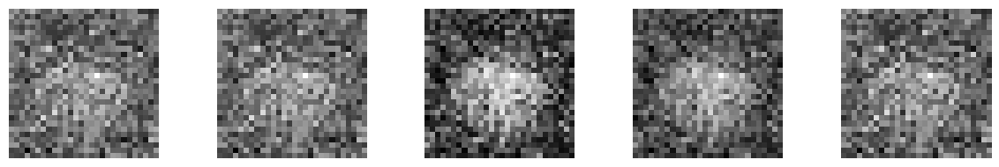

--------------- Epoch 4 ---------------
1/1 [==============================] - 0s 16ms/step


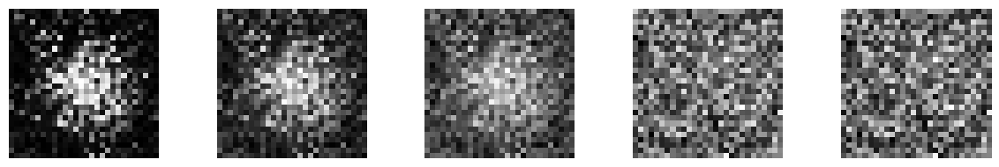

--------------- Epoch 5 ---------------
1/1 [==============================] - 0s 18ms/step


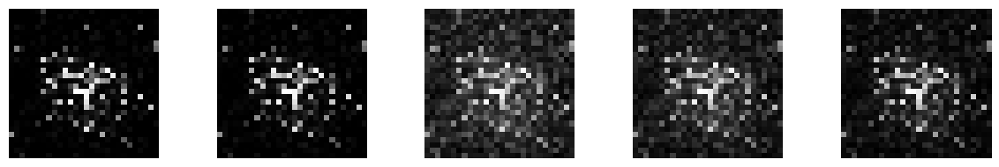

--------------- Epoch 6 ---------------
1/1 [==============================] - 0s 27ms/step


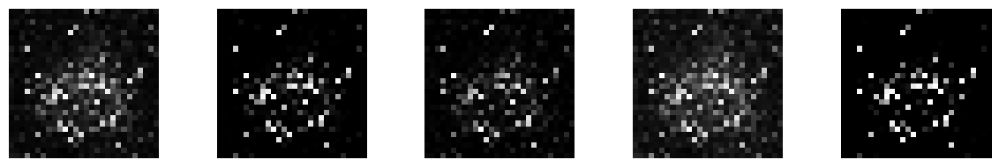

--------------- Epoch 7 ---------------
1/1 [==============================] - 0s 16ms/step


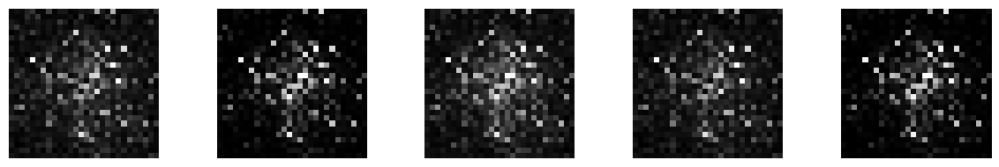

--------------- Epoch 8 ---------------
1/1 [==============================] - 0s 16ms/step


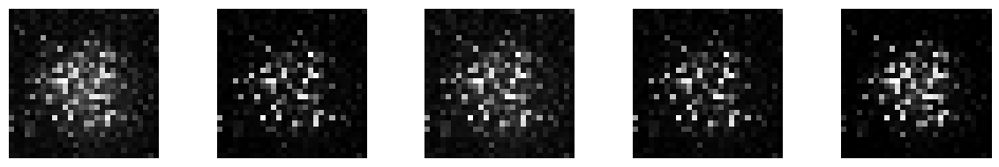

--------------- Epoch 9 ---------------
1/1 [==============================] - 0s 17ms/step


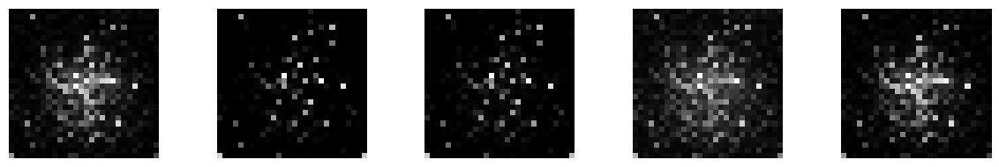

--------------- Epoch 10 ---------------
1/1 [==============================] - 0s 24ms/step


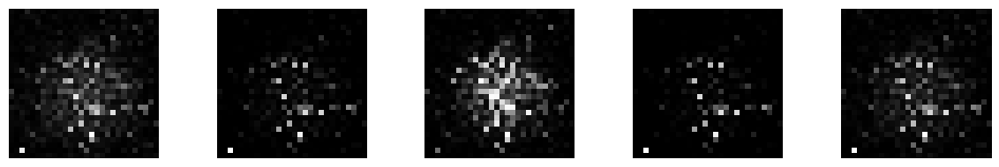

--------------- Epoch 11 ---------------
1/1 [==============================] - 0s 21ms/step


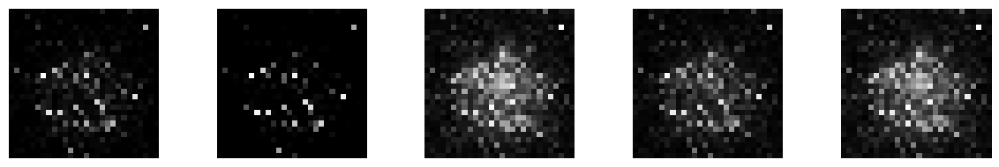

--------------- Epoch 12 ---------------
1/1 [==============================] - 0s 19ms/step


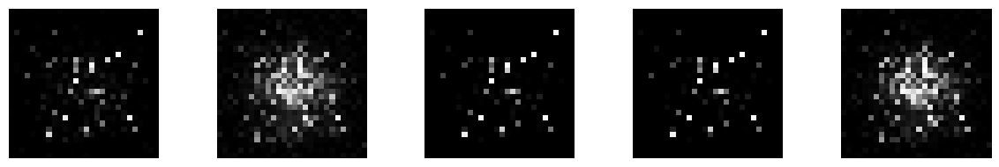

--------------- Epoch 13 ---------------
1/1 [==============================] - 0s 16ms/step


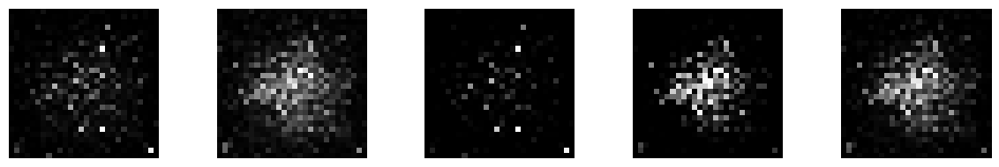

--------------- Epoch 14 ---------------
1/1 [==============================] - 0s 29ms/step


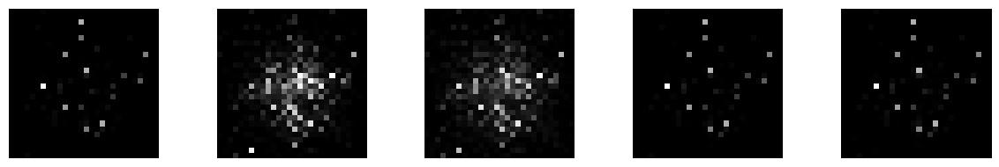

--------------- Epoch 15 ---------------
1/1 [==============================] - 0s 17ms/step


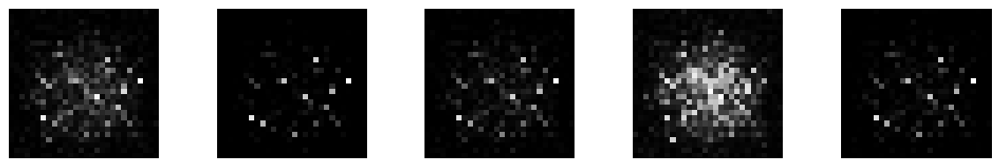

--------------- Epoch 16 ---------------
1/1 [==============================] - 0s 19ms/step


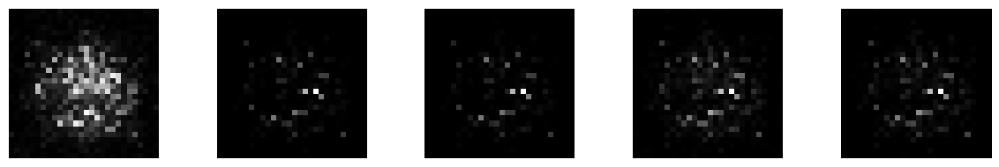

--------------- Epoch 17 ---------------
1/1 [==============================] - 0s 16ms/step


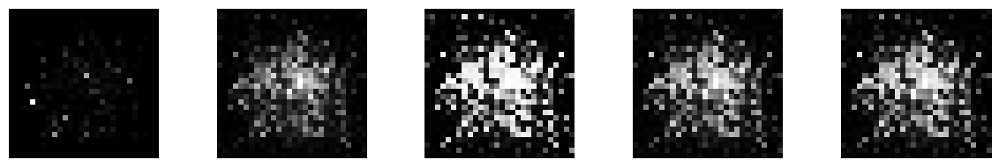

--------------- Epoch 18 ---------------
1/1 [==============================] - 0s 32ms/step


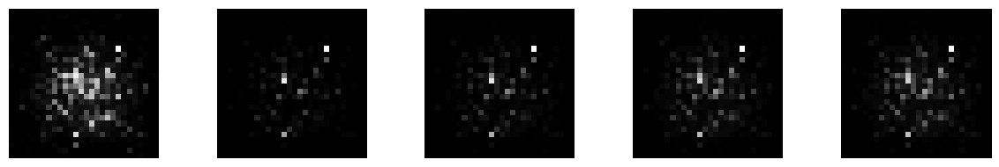

--------------- Epoch 19 ---------------
1/1 [==============================] - 0s 16ms/step


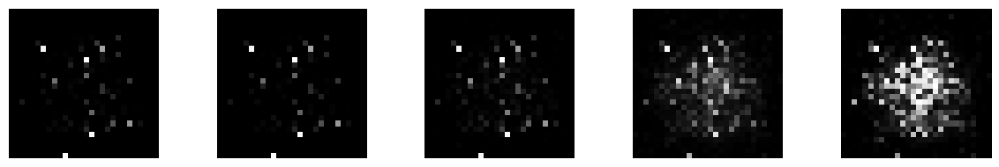

--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 16ms/step


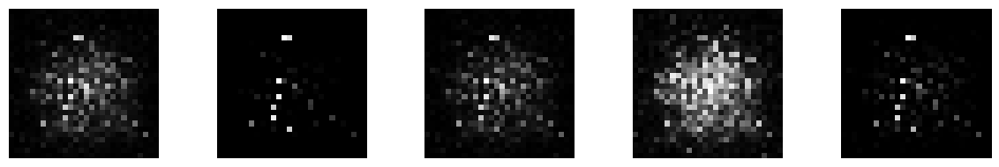

--------------- Epoch 21 ---------------
1/1 [==============================] - 0s 16ms/step


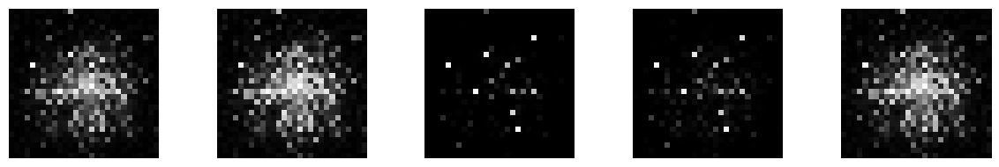

--------------- Epoch 22 ---------------
1/1 [==============================] - 0s 25ms/step


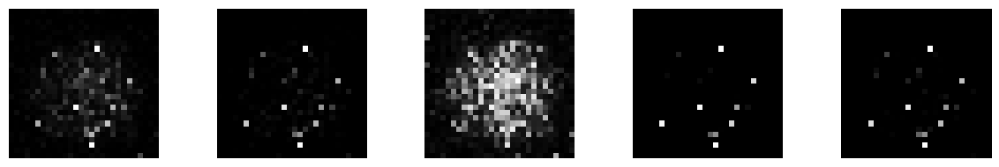

--------------- Epoch 23 ---------------
1/1 [==============================] - 0s 17ms/step


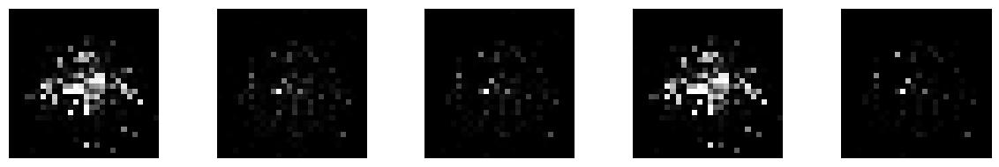

--------------- Epoch 24 ---------------
1/1 [==============================] - 0s 17ms/step


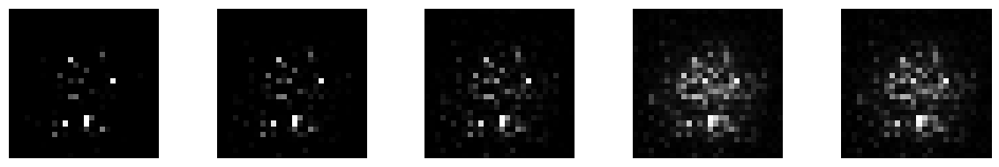

--------------- Epoch 25 ---------------
1/1 [==============================] - 0s 17ms/step


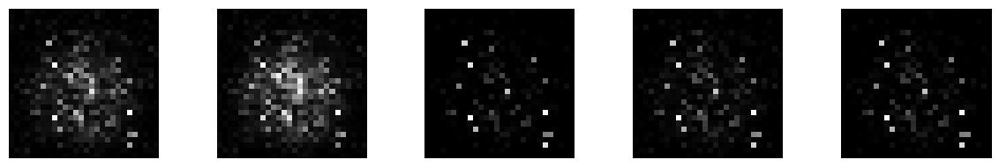

--------------- Epoch 26 ---------------
1/1 [==============================] - 0s 30ms/step


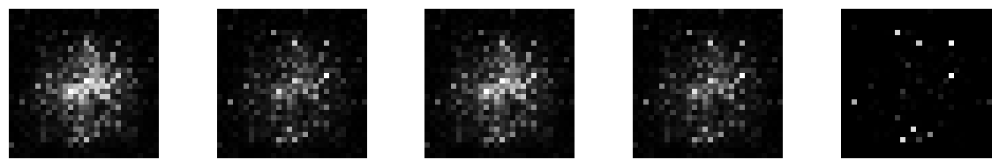

--------------- Epoch 27 ---------------
1/1 [==============================] - 0s 17ms/step


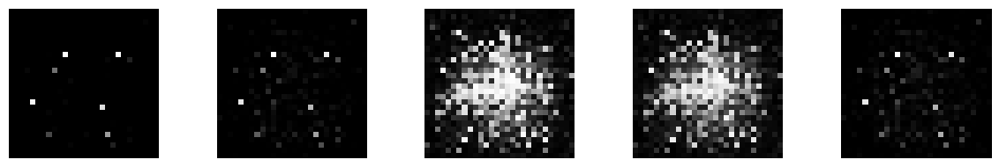

--------------- Epoch 28 ---------------
1/1 [==============================] - 0s 18ms/step


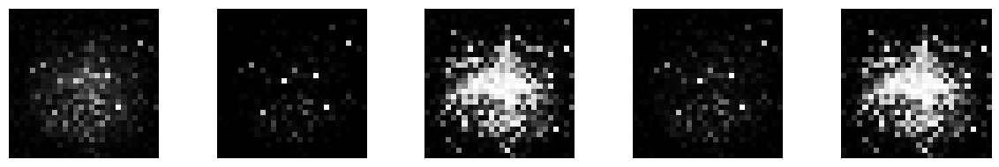

--------------- Epoch 29 ---------------
1/1 [==============================] - 0s 16ms/step


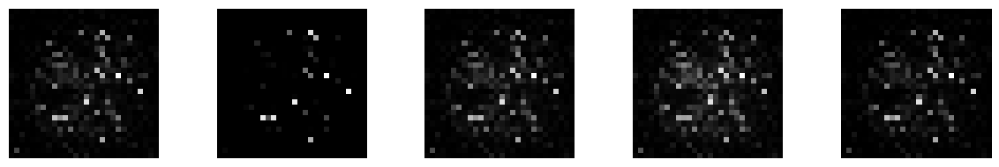

--------------- Epoch 30 ---------------
1/1 [==============================] - 0s 22ms/step


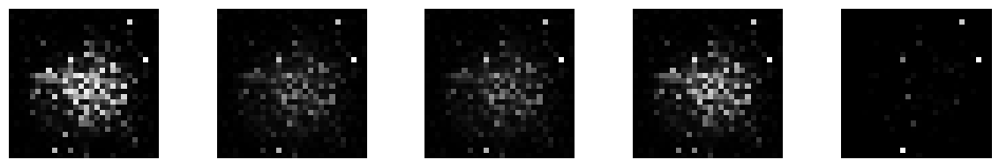

--------------- Epoch 31 ---------------
1/1 [==============================] - 0s 16ms/step


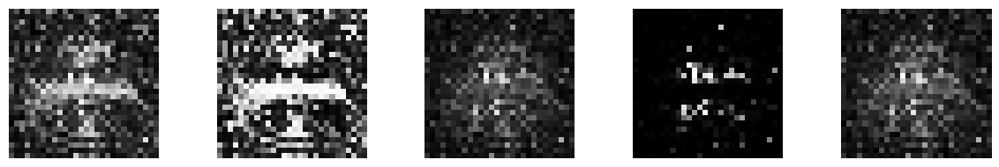

--------------- Epoch 32 ---------------
1/1 [==============================] - 0s 17ms/step


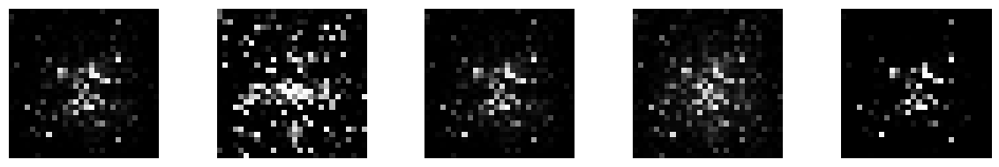

--------------- Epoch 33 ---------------
1/1 [==============================] - 0s 18ms/step


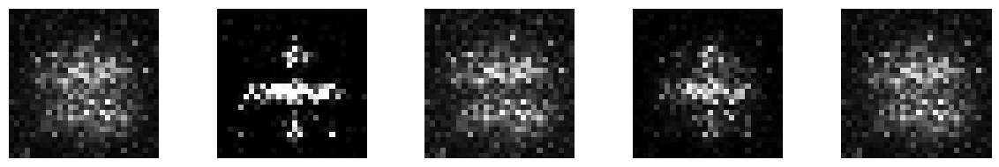

--------------- Epoch 34 ---------------
1/1 [==============================] - 0s 31ms/step


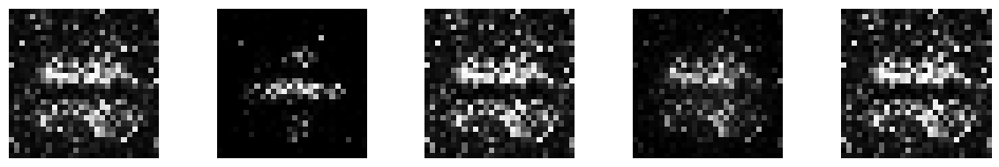

--------------- Epoch 35 ---------------
1/1 [==============================] - 0s 16ms/step


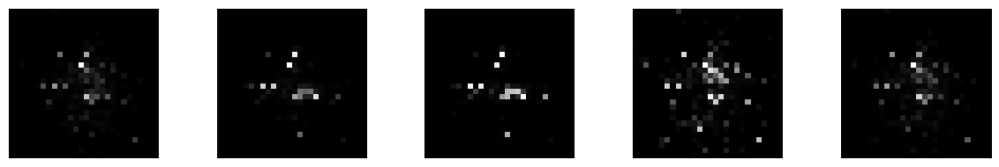

--------------- Epoch 36 ---------------
1/1 [==============================] - 0s 16ms/step


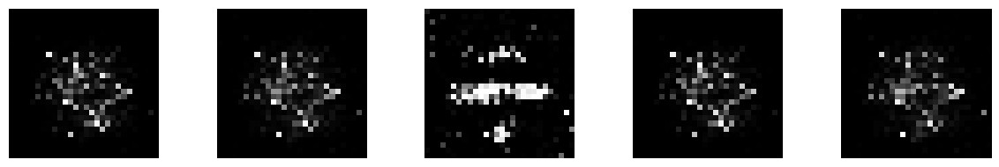

--------------- Epoch 37 ---------------
1/1 [==============================] - 0s 17ms/step


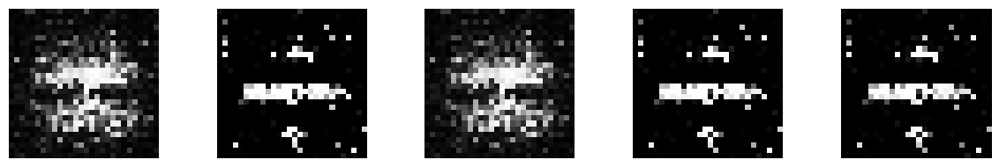

--------------- Epoch 38 ---------------
1/1 [==============================] - 0s 25ms/step


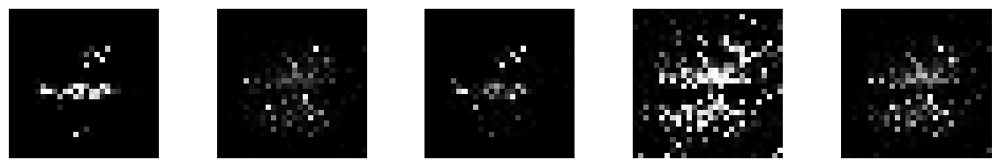

--------------- Epoch 39 ---------------
1/1 [==============================] - 0s 17ms/step


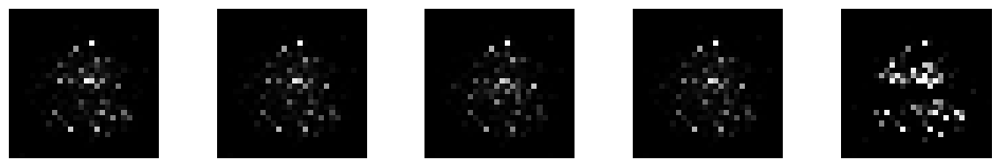

--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 17ms/step


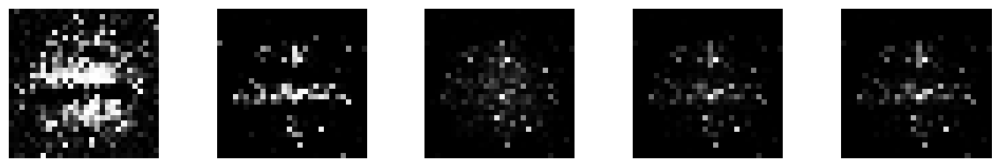

--------------- Epoch 41 ---------------
1/1 [==============================] - 0s 17ms/step


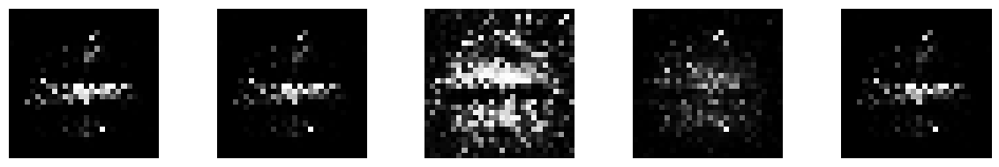

--------------- Epoch 42 ---------------
1/1 [==============================] - 0s 18ms/step


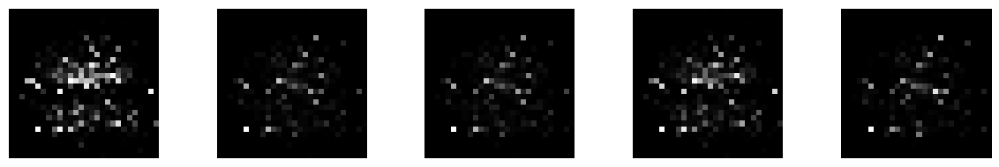

--------------- Epoch 43 ---------------
1/1 [==============================] - 0s 18ms/step


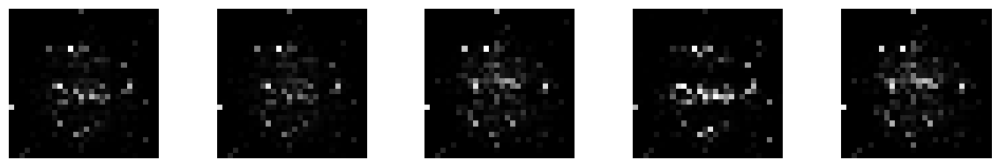

--------------- Epoch 44 ---------------
1/1 [==============================] - 0s 17ms/step


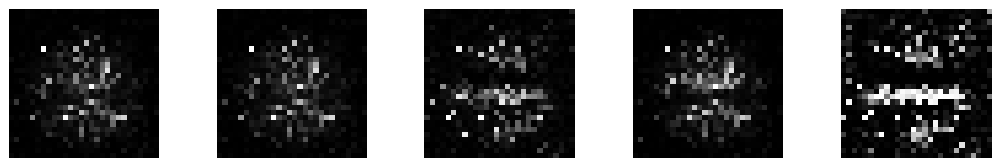

--------------- Epoch 45 ---------------
1/1 [==============================] - 0s 16ms/step


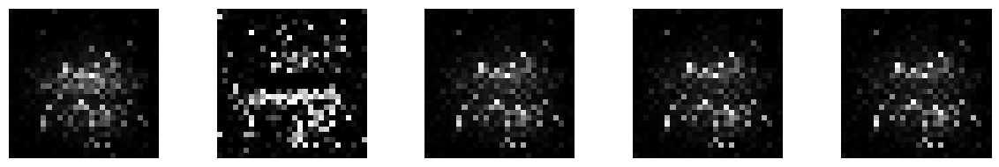

--------------- Epoch 46 ---------------
1/1 [==============================] - 0s 17ms/step


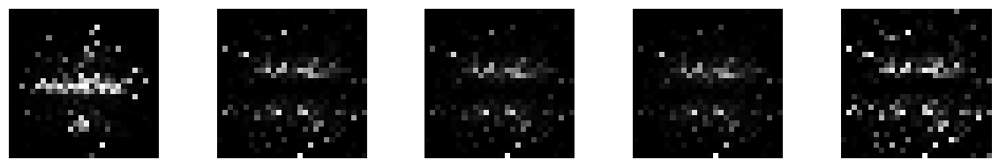

--------------- Epoch 47 ---------------
1/1 [==============================] - 0s 17ms/step


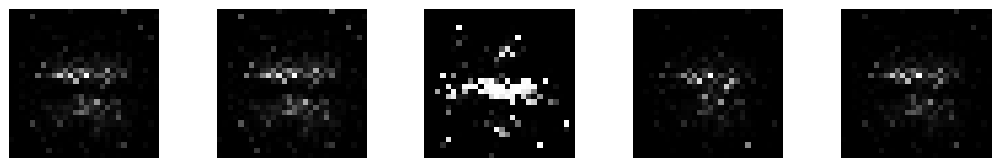

--------------- Epoch 48 ---------------
1/1 [==============================] - 0s 16ms/step


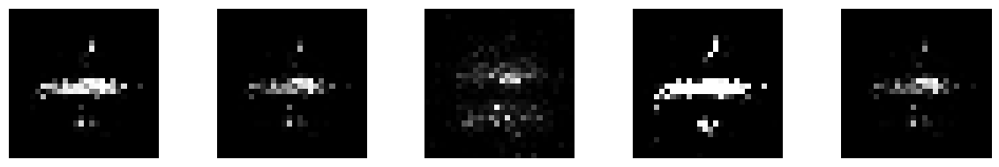

--------------- Epoch 49 ---------------
1/1 [==============================] - 0s 26ms/step


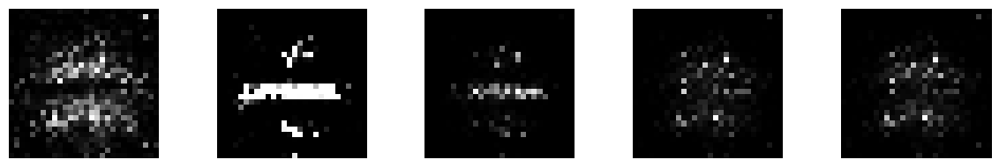

--------------- Epoch 50 ---------------
1/1 [==============================] - 0s 17ms/step


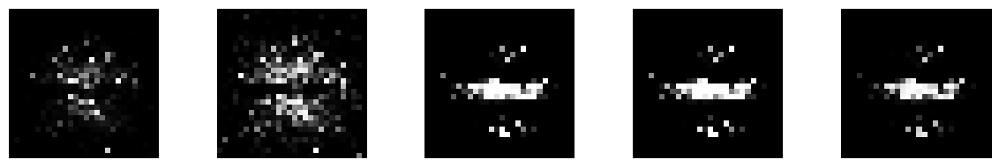

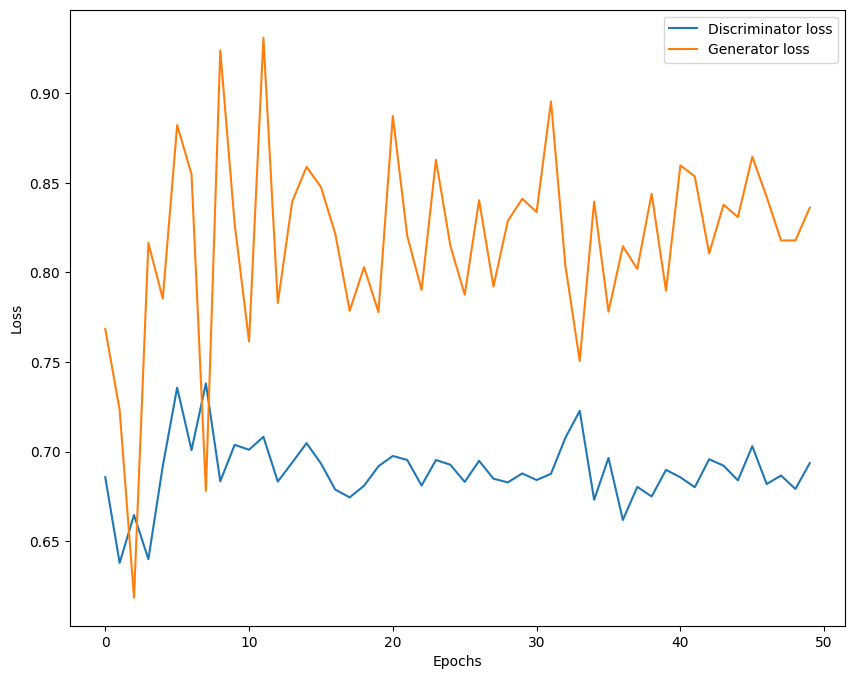

In [ ]:
train(z_dim, epochs=50, BATCH_SIZE=256)

In [52]:
z_dim = 1
adam = Adam(learning_rate=0.0005, beta_1=0.5)

# (a) GENERATOR
g = Sequential()
g.add(Dense(128, input_dim=z_dim, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(256, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(512, activation=LeakyReLU(alpha=0.2)))
g.add(Dense(784, activation='sigmoid'))  # Values between 0 and 1
g.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (b) DISCRIMINATOR
d = Sequential()
d.add(Dense(512, input_dim=784, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(256, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(128, activation=LeakyReLU(alpha=0.2)))
d.add(Dropout(0.3))
d.add(Dense(1, activation='sigmoid'))  # Values between 0 and 1
d.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])

# (c) GAN
d.trainable = False
inputs = Input(shape=(z_dim, ))
hidden = g(inputs)
output = d(hidden)
gan = Model(inputs, output)
gan.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])


def plot_loss(losses):
    """
    @losses.keys():
        0: loss
        1: accuracy
    """
    d_loss = [v[0] for v in losses["D"]]
    g_loss = [v[0] for v in losses["G"]]

    plt.figure(figsize=(10,8))
    plt.plot(d_loss, label="Discriminator loss")
    plt.plot(g_loss, label="Generator loss")
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

def plot_generated(z_dim, n_ex=5, dim=(1, 5), figsize=(12, 2)):
    noise = np.random.normal(0, 1, size=(n_ex, z_dim))
    generated_images = g.predict(noise)
    generated_images = generated_images.reshape(n_ex, 28, 28)

    plt.figure(figsize=figsize)
    for i in range(generated_images.shape[0]):
        plt.subplot(dim[0], dim[1], i+1)
        plt.imshow(generated_images[i], interpolation='nearest', cmap='gray_r')
        plt.axis('off')
    plt.tight_layout()
    plt.show()


losses = {"D":[], "G":[]}

def train(z_dim, epochs=1, plt_frq=1, BATCH_SIZE=128):
    batchCount = int(X_train.shape[0] / BATCH_SIZE)
    print('Epochs:', epochs)
    print('Batch size:', BATCH_SIZE)
    print('Batches per epoch:', batchCount)

    for e in tqdm_notebook(range(1, epochs+1)):
        if e == 1 or e%plt_frq == 0:
            print('-'*15, 'Epoch %d' % e, '-'*15)

        for _ in range(batchCount):  # tqdm_notebook(range(batchCount), leave=False):
            # Create a batch by drawing random index numbers from the training set
            image_batch = X_train[np.random.randint(0, X_train.shape[0], size=BATCH_SIZE)]
            # Create noise vectors for the generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))

            # Generate the images from the noise
            generated_images = g.predict(noise)
            X = np.concatenate((image_batch, generated_images))
            # Create labels
            y = np.zeros(2*BATCH_SIZE)
            y[:BATCH_SIZE] = 0.9  # One-sided label smoothing

            # Train discriminator on generated images
            d.trainable = True
            d_loss = d.train_on_batch(X, y)

            # Train generator
            noise = np.random.normal(0, 1, size=(BATCH_SIZE, z_dim))
            y2 = np.ones(BATCH_SIZE)
            d.trainable = False
            g_loss = gan.train_on_batch(noise, y2)

        # Only store losses from final
        losses["D"].append(d_loss)
        losses["G"].append(g_loss)

        # Update the plots
        if e == 1 or e%plt_frq == 0:
            plot_generated(z_dim)
    plot_loss(losses)

Epochs: 100
Batch size: 256
Batches per epoch: 8


  0%|          | 0/100 [00:00<?, ?it/s]

--------------- Epoch 1 ---------------
1/1 [==============================] - 0s 57ms/step


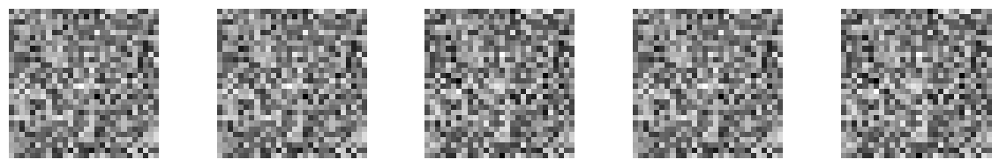

--------------- Epoch 2 ---------------
1/1 [==============================] - 0s 15ms/step


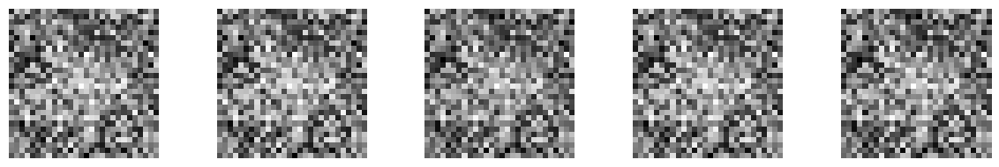

--------------- Epoch 3 ---------------
1/1 [==============================] - 0s 25ms/step


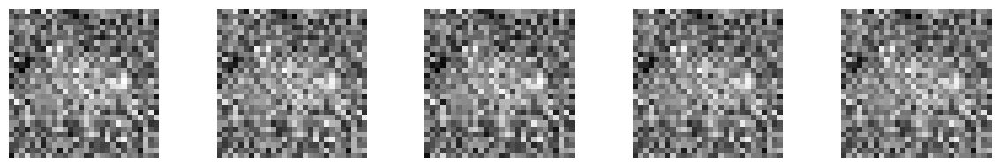

--------------- Epoch 4 ---------------
1/1 [==============================] - 0s 18ms/step


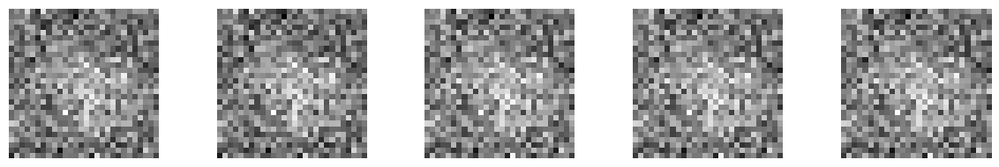

--------------- Epoch 5 ---------------
1/1 [==============================] - 0s 17ms/step


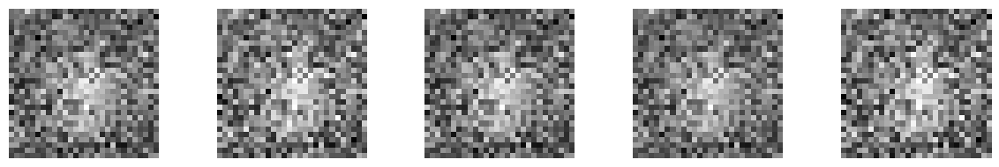

--------------- Epoch 6 ---------------
1/1 [==============================] - 0s 18ms/step


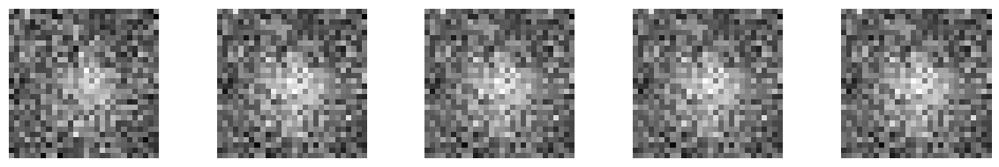

--------------- Epoch 7 ---------------
1/1 [==============================] - 0s 17ms/step


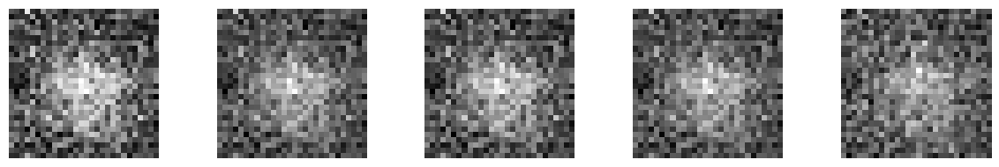

--------------- Epoch 8 ---------------
1/1 [==============================] - 0s 16ms/step


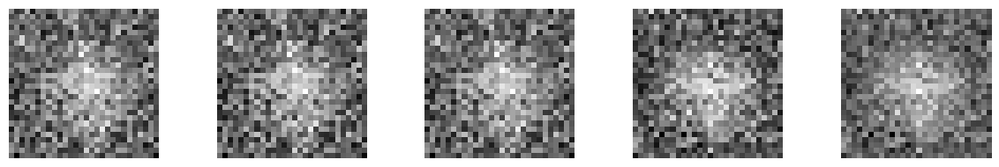

--------------- Epoch 9 ---------------
1/1 [==============================] - 0s 19ms/step


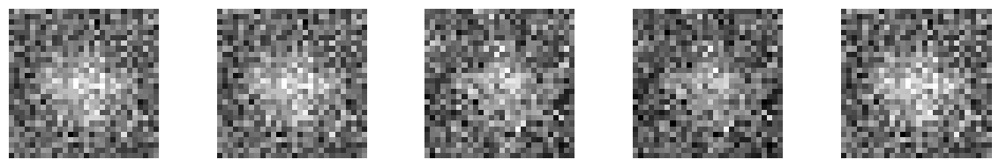

--------------- Epoch 10 ---------------
1/1 [==============================] - 0s 18ms/step


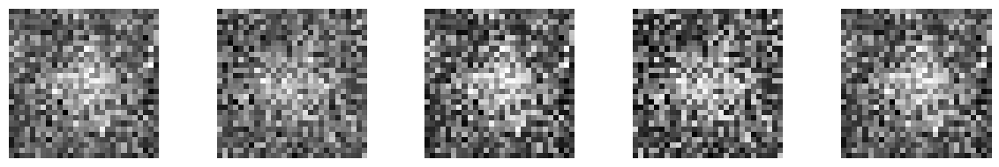

--------------- Epoch 11 ---------------
1/1 [==============================] - 0s 17ms/step


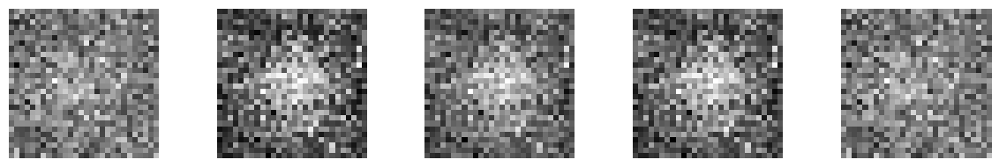

--------------- Epoch 12 ---------------
1/1 [==============================] - 0s 18ms/step


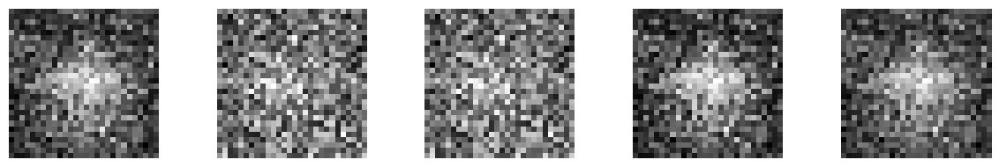

--------------- Epoch 13 ---------------
1/1 [==============================] - 0s 32ms/step


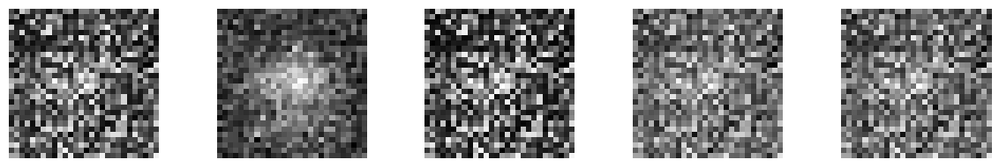

--------------- Epoch 14 ---------------
1/1 [==============================] - 0s 40ms/step


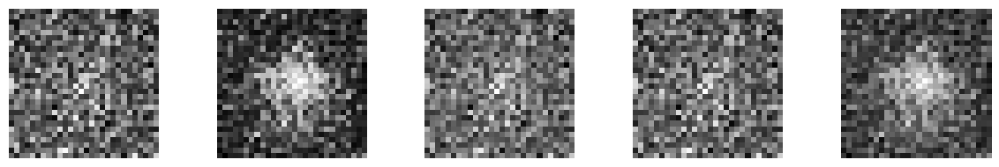

--------------- Epoch 15 ---------------
1/1 [==============================] - 0s 26ms/step


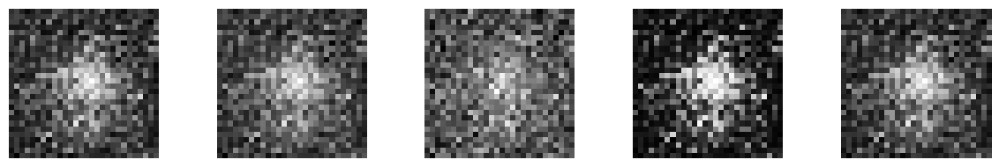

--------------- Epoch 16 ---------------
1/1 [==============================] - 0s 17ms/step


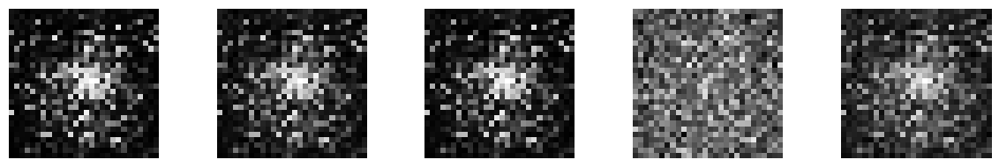

--------------- Epoch 17 ---------------
1/1 [==============================] - 0s 17ms/step


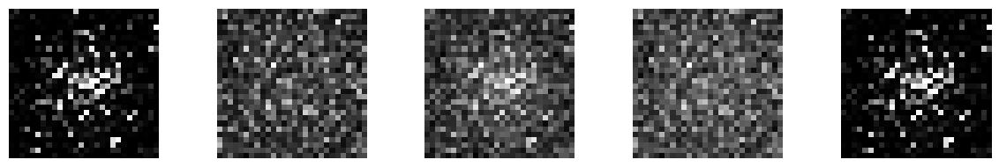

--------------- Epoch 18 ---------------
1/1 [==============================] - 0s 19ms/step


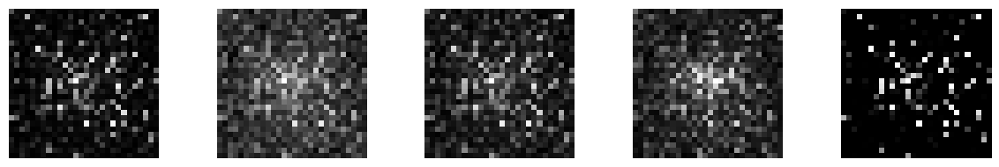

--------------- Epoch 19 ---------------
1/1 [==============================] - 0s 20ms/step


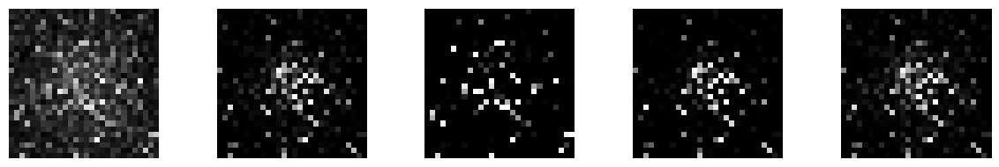

--------------- Epoch 20 ---------------
1/1 [==============================] - 0s 17ms/step


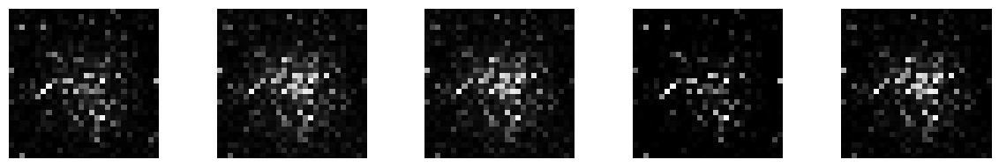

--------------- Epoch 21 ---------------
1/1 [==============================] - 0s 16ms/step


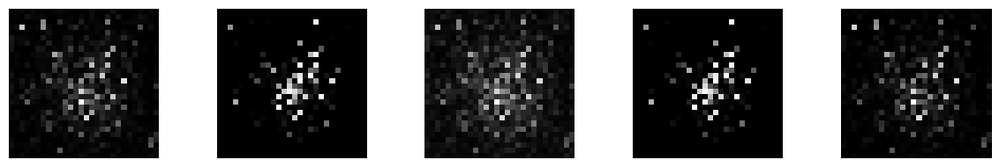

--------------- Epoch 22 ---------------
1/1 [==============================] - 0s 17ms/step


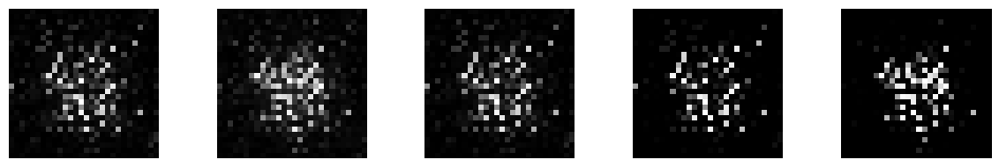

--------------- Epoch 23 ---------------
1/1 [==============================] - 0s 25ms/step


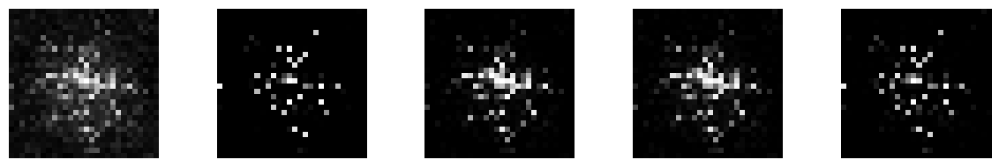

--------------- Epoch 24 ---------------
1/1 [==============================] - 0s 19ms/step


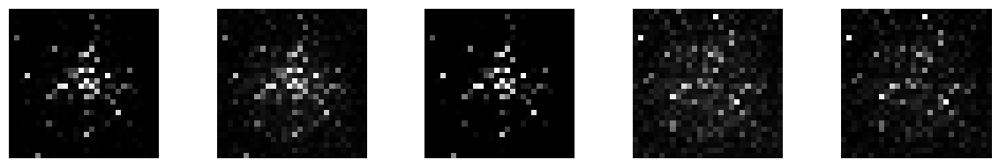

--------------- Epoch 25 ---------------
1/1 [==============================] - 0s 17ms/step


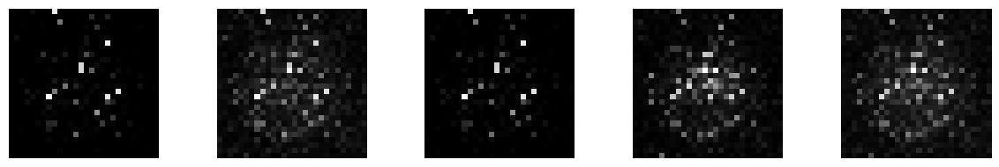

--------------- Epoch 26 ---------------
1/1 [==============================] - 0s 17ms/step


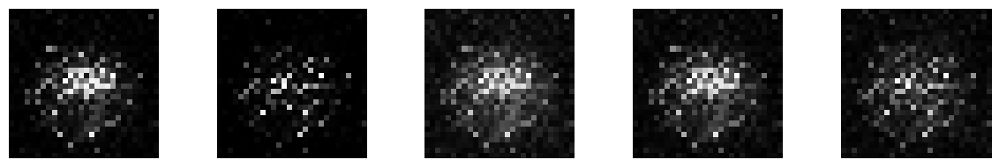

--------------- Epoch 27 ---------------
1/1 [==============================] - 0s 32ms/step


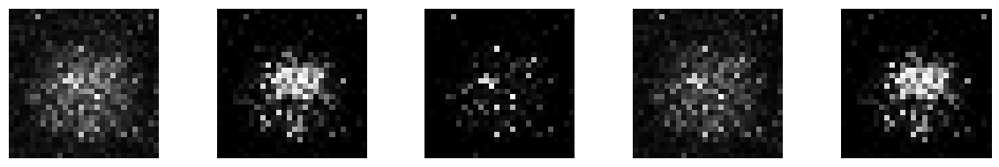

--------------- Epoch 28 ---------------
1/1 [==============================] - 0s 25ms/step


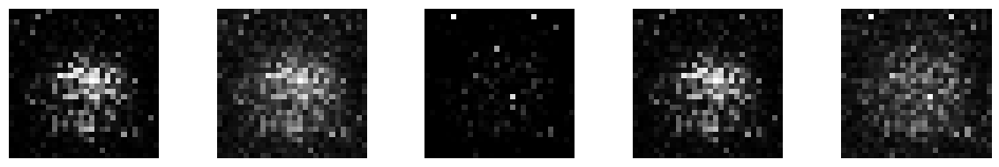

--------------- Epoch 29 ---------------
1/1 [==============================] - 0s 19ms/step


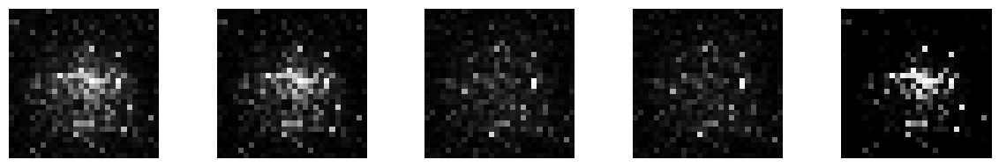

--------------- Epoch 30 ---------------
1/1 [==============================] - 0s 17ms/step


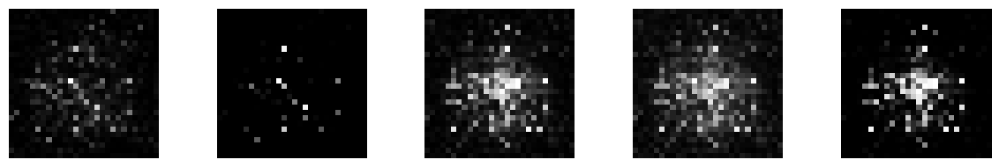

--------------- Epoch 31 ---------------
1/1 [==============================] - 0s 18ms/step


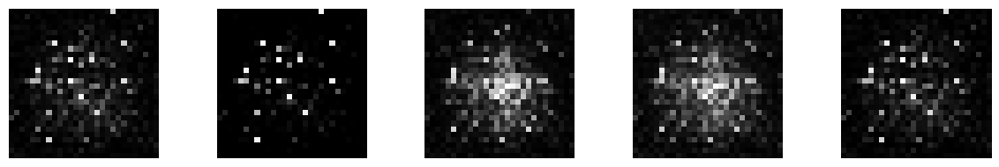

--------------- Epoch 32 ---------------
1/1 [==============================] - 0s 24ms/step


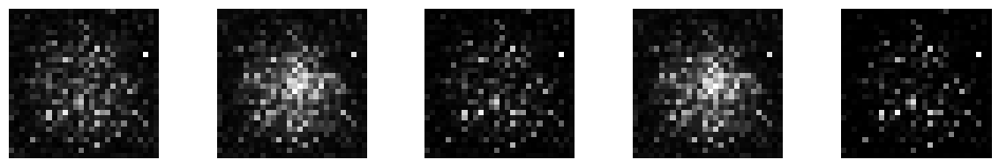

--------------- Epoch 33 ---------------
1/1 [==============================] - 0s 33ms/step


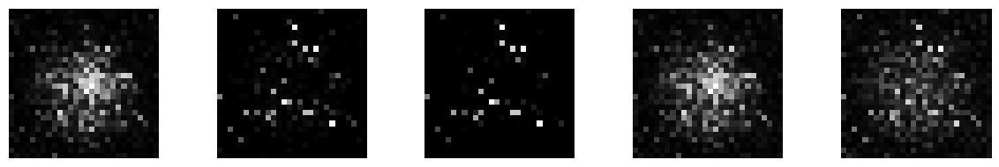

--------------- Epoch 34 ---------------
1/1 [==============================] - 0s 17ms/step


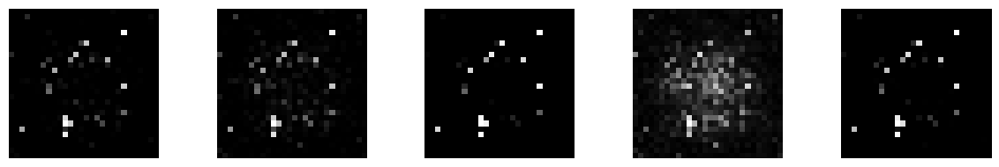

--------------- Epoch 35 ---------------
1/1 [==============================] - 0s 18ms/step


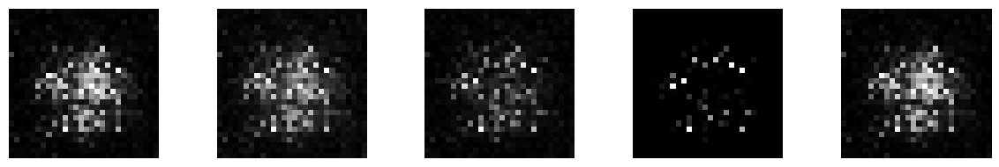

--------------- Epoch 36 ---------------
1/1 [==============================] - 0s 17ms/step


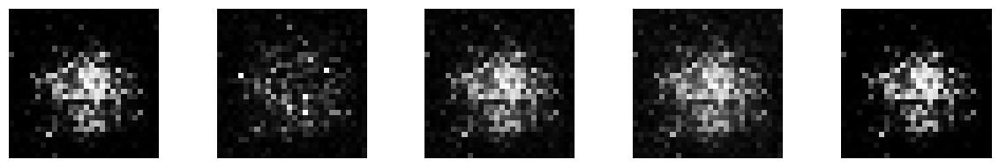

--------------- Epoch 37 ---------------
1/1 [==============================] - 0s 17ms/step


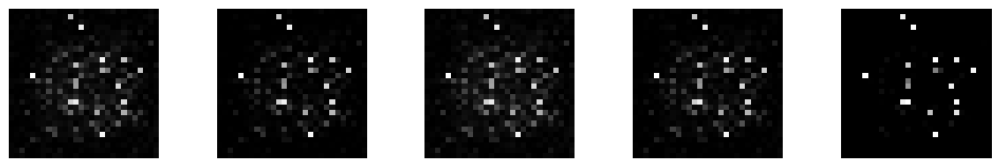

--------------- Epoch 38 ---------------
1/1 [==============================] - 0s 16ms/step


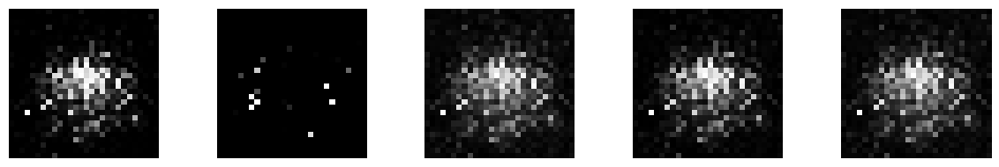

--------------- Epoch 39 ---------------
1/1 [==============================] - 0s 18ms/step


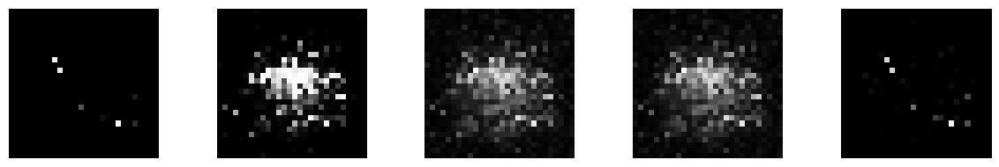

--------------- Epoch 40 ---------------
1/1 [==============================] - 0s 18ms/step


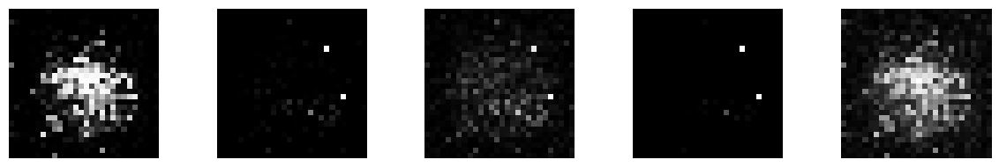

--------------- Epoch 41 ---------------
1/1 [==============================] - 0s 25ms/step


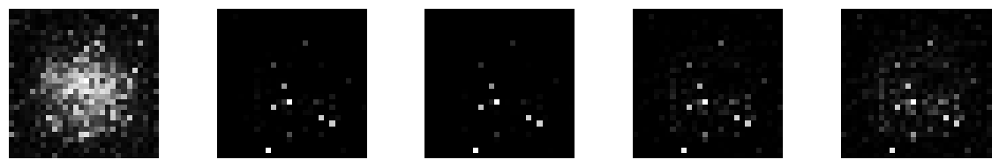

--------------- Epoch 42 ---------------
1/1 [==============================] - 0s 24ms/step


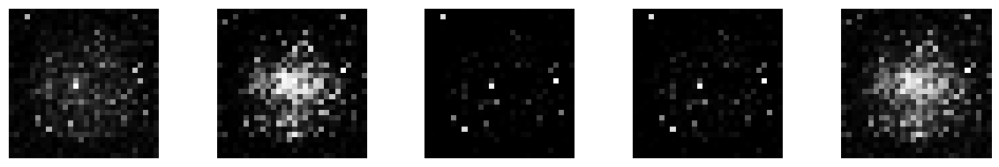

--------------- Epoch 43 ---------------
1/1 [==============================] - 0s 19ms/step


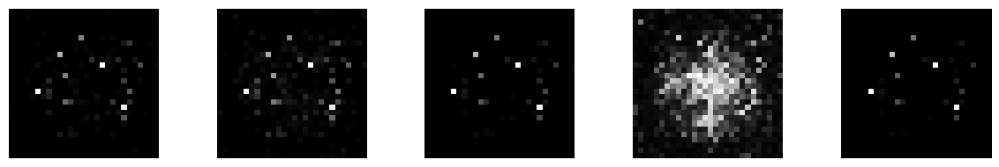

--------------- Epoch 44 ---------------
1/1 [==============================] - 0s 17ms/step


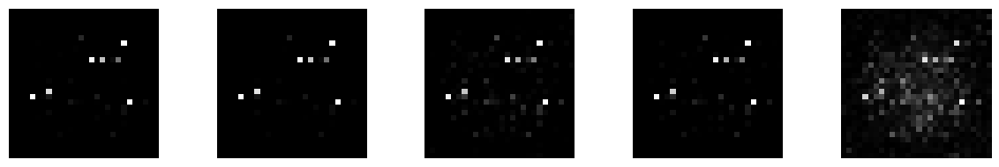

--------------- Epoch 45 ---------------
1/1 [==============================] - 0s 20ms/step


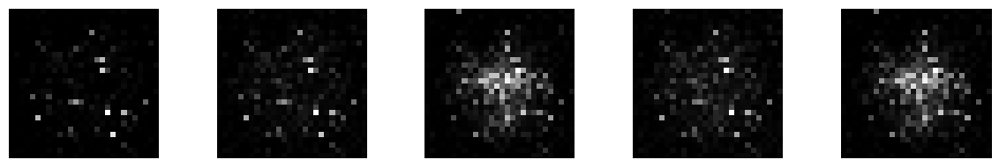

--------------- Epoch 46 ---------------
1/1 [==============================] - 0s 18ms/step


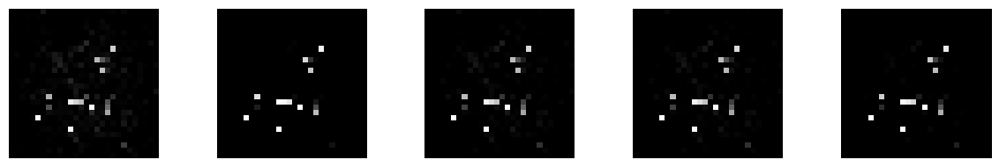

--------------- Epoch 47 ---------------
1/1 [==============================] - 0s 17ms/step


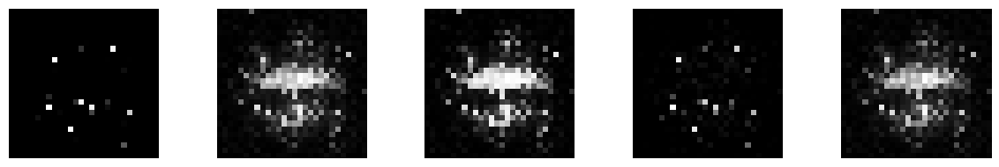

--------------- Epoch 48 ---------------
1/1 [==============================] - 0s 16ms/step


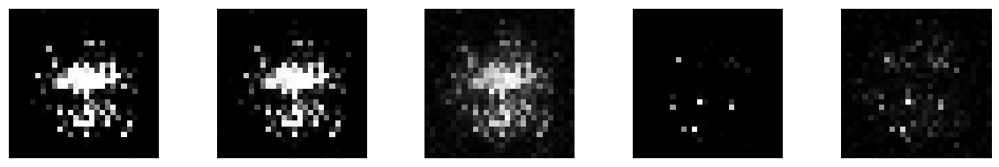

--------------- Epoch 49 ---------------
1/1 [==============================] - 0s 22ms/step


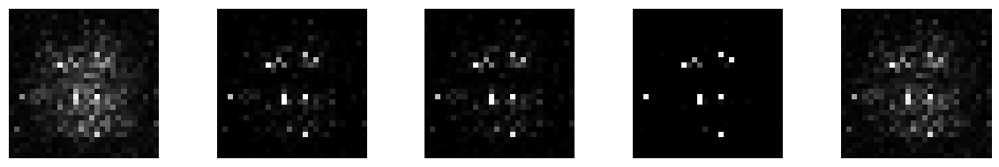

--------------- Epoch 50 ---------------
1/1 [==============================] - 0s 18ms/step


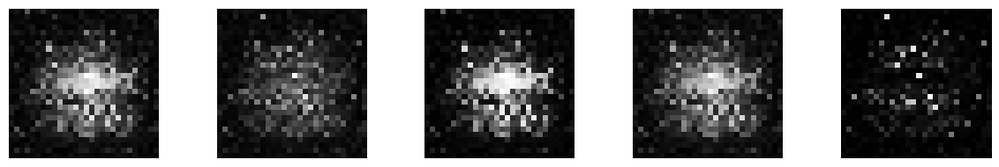

--------------- Epoch 51 ---------------
1/1 [==============================] - 0s 28ms/step


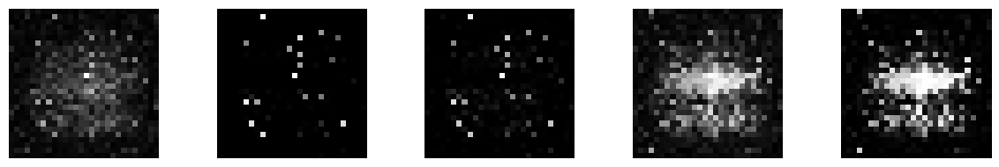

--------------- Epoch 52 ---------------
1/1 [==============================] - 0s 25ms/step


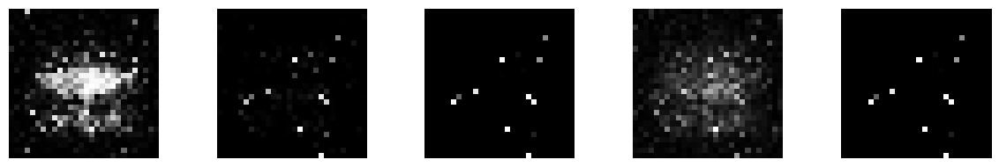

--------------- Epoch 53 ---------------
1/1 [==============================] - 0s 18ms/step


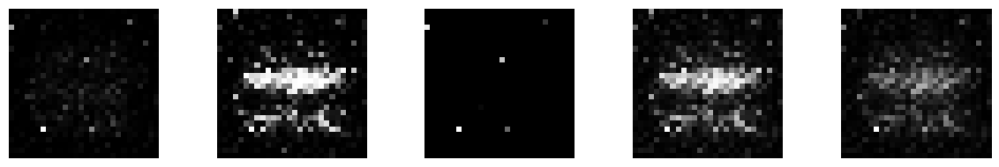

--------------- Epoch 54 ---------------
1/1 [==============================] - 0s 24ms/step


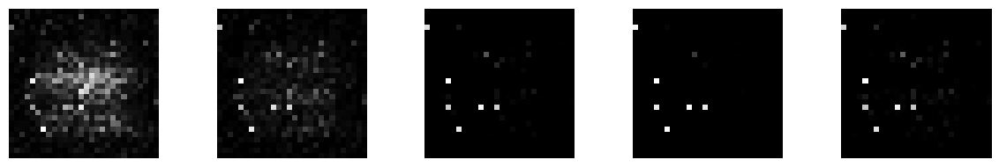

--------------- Epoch 55 ---------------
1/1 [==============================] - 0s 18ms/step


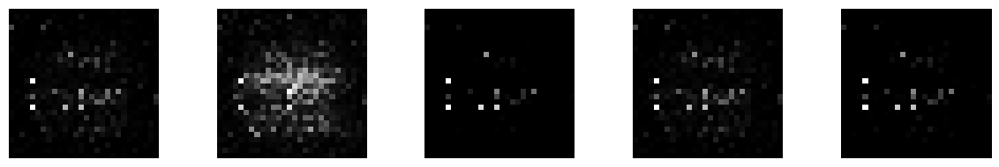

--------------- Epoch 56 ---------------
1/1 [==============================] - 0s 19ms/step


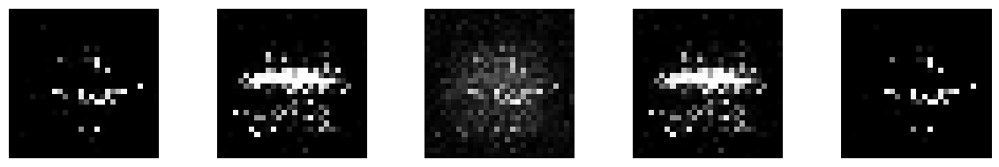

--------------- Epoch 57 ---------------
1/1 [==============================] - 0s 19ms/step


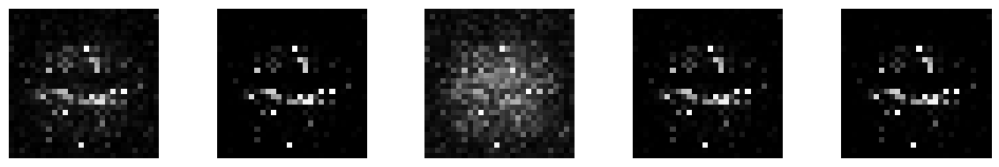

--------------- Epoch 58 ---------------
1/1 [==============================] - 0s 17ms/step


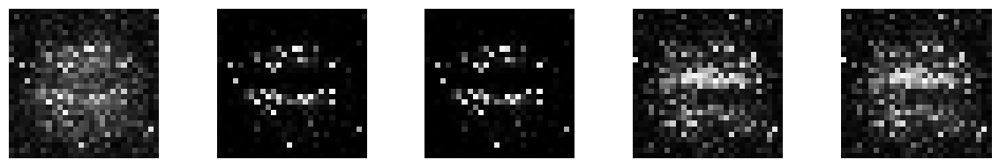

--------------- Epoch 59 ---------------
1/1 [==============================] - 0s 18ms/step


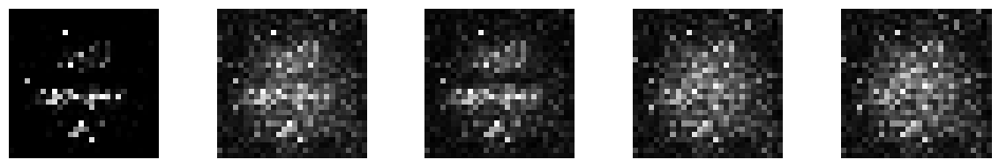

--------------- Epoch 60 ---------------
1/1 [==============================] - 0s 29ms/step


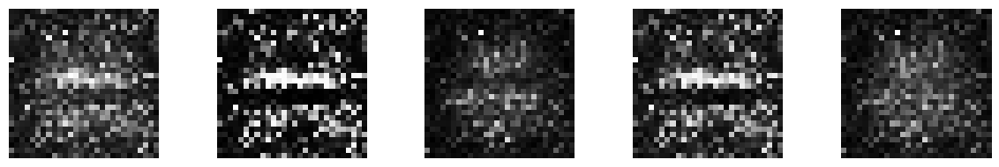

--------------- Epoch 61 ---------------
1/1 [==============================] - 0s 26ms/step


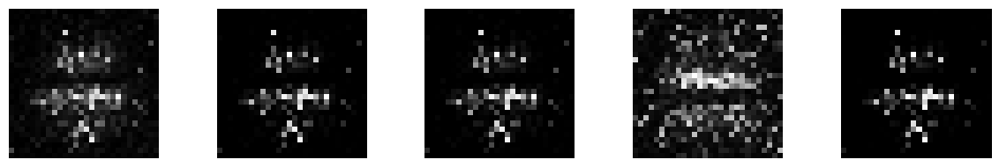

--------------- Epoch 62 ---------------
1/1 [==============================] - 0s 39ms/step


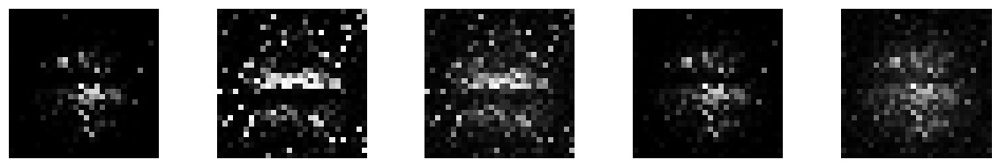

--------------- Epoch 63 ---------------
1/1 [==============================] - 0s 32ms/step


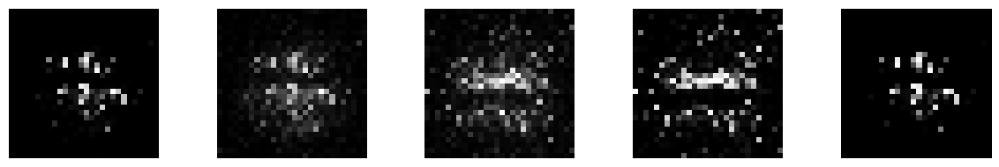

--------------- Epoch 64 ---------------
1/1 [==============================] - 0s 29ms/step


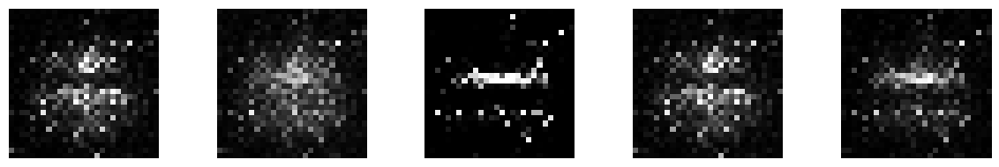

--------------- Epoch 65 ---------------
1/1 [==============================] - 0s 119ms/step


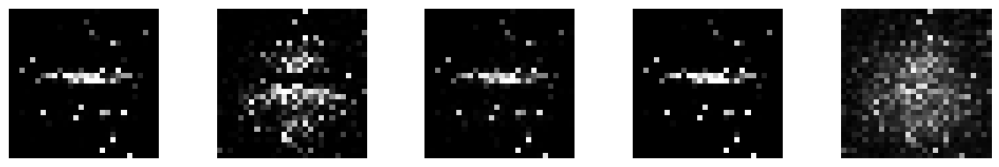

--------------- Epoch 66 ---------------
1/1 [==============================] - 0s 26ms/step


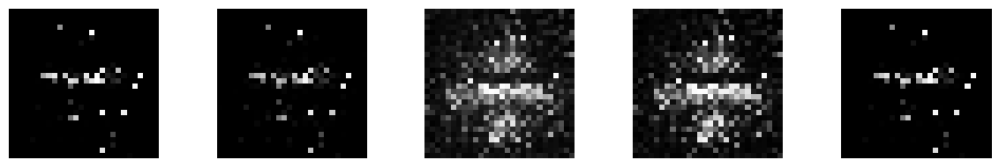

--------------- Epoch 67 ---------------
1/1 [==============================] - 0s 25ms/step


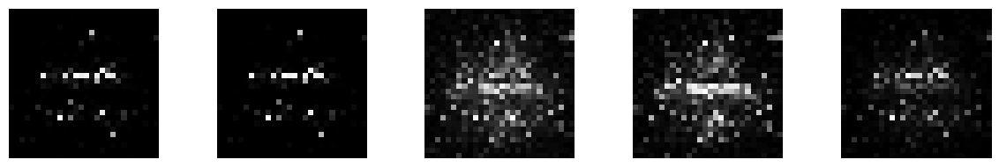

--------------- Epoch 68 ---------------
1/1 [==============================] - 0s 20ms/step


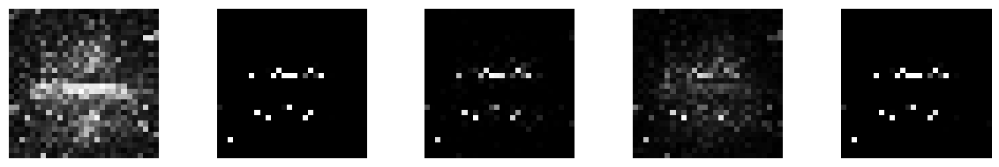

--------------- Epoch 69 ---------------
1/1 [==============================] - 0s 17ms/step


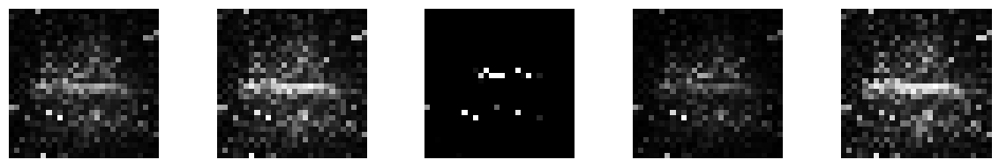

--------------- Epoch 70 ---------------
1/1 [==============================] - 0s 19ms/step


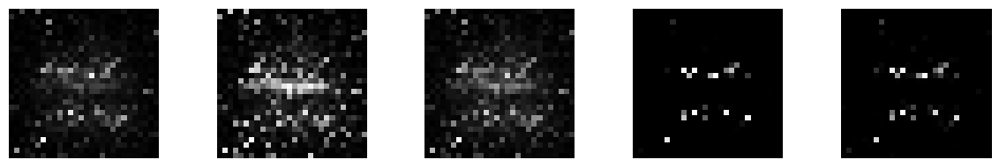

--------------- Epoch 71 ---------------
1/1 [==============================] - 0s 18ms/step


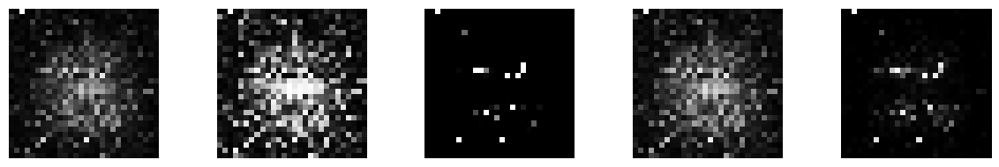

--------------- Epoch 72 ---------------
1/1 [==============================] - 0s 17ms/step


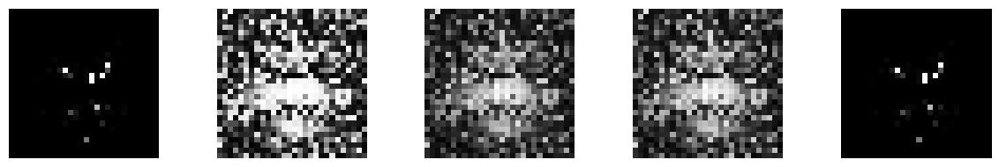

--------------- Epoch 73 ---------------
1/1 [==============================] - 0s 18ms/step


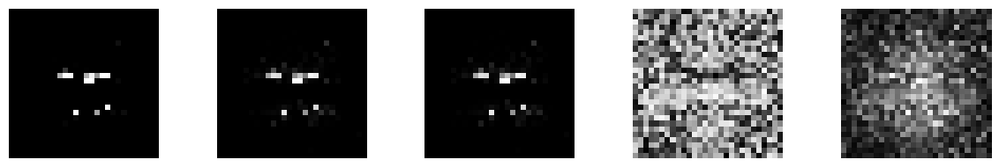

--------------- Epoch 74 ---------------
1/1 [==============================] - 0s 18ms/step


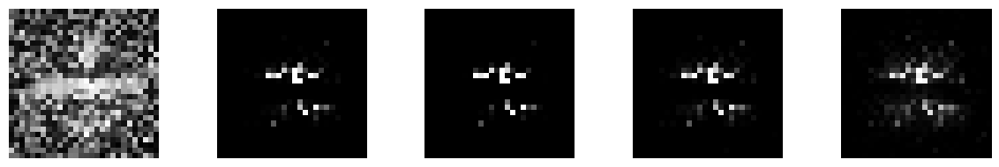

--------------- Epoch 75 ---------------
1/1 [==============================] - 0s 19ms/step


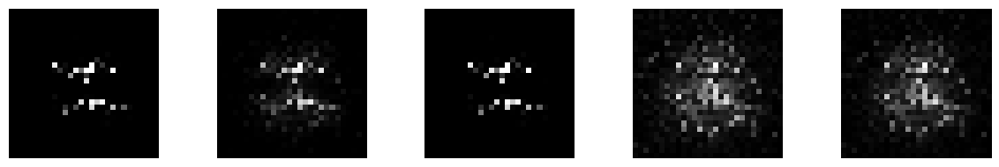

--------------- Epoch 76 ---------------
1/1 [==============================] - 0s 29ms/step


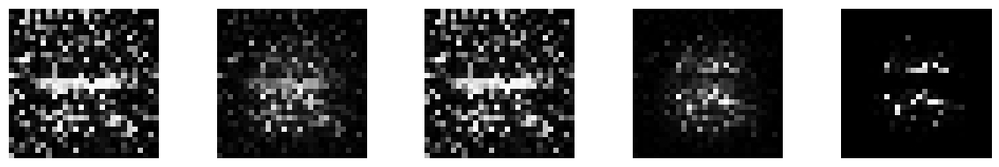

--------------- Epoch 77 ---------------
1/1 [==============================] - 0s 36ms/step


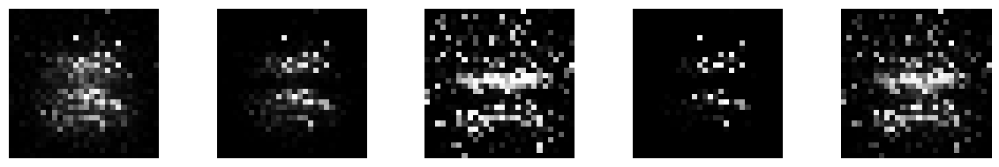

--------------- Epoch 78 ---------------
1/1 [==============================] - 0s 16ms/step


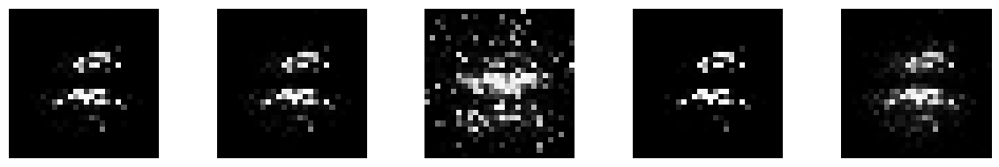

--------------- Epoch 79 ---------------
1/1 [==============================] - 0s 17ms/step


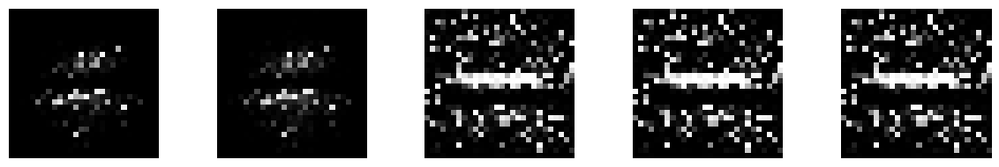

--------------- Epoch 80 ---------------
1/1 [==============================] - 0s 17ms/step


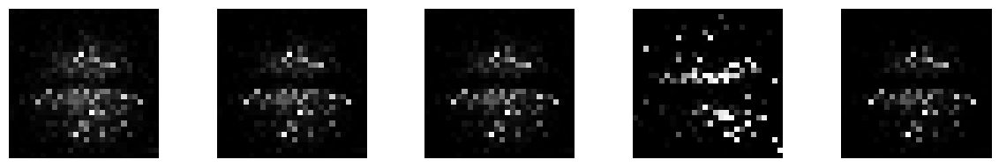

--------------- Epoch 81 ---------------
1/1 [==============================] - 0s 16ms/step


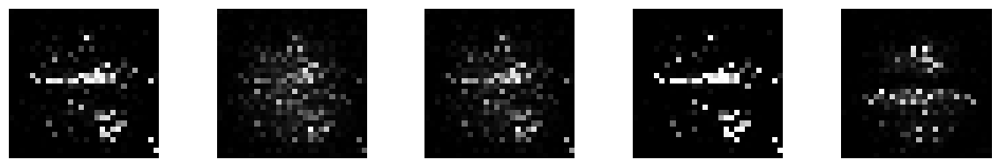

--------------- Epoch 82 ---------------
1/1 [==============================] - 0s 16ms/step


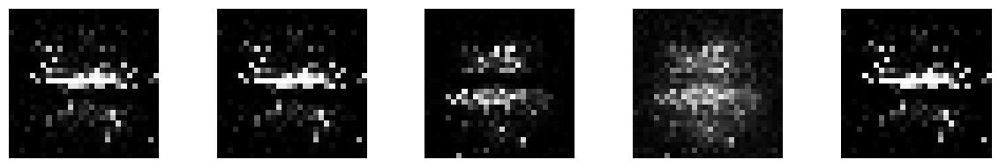

--------------- Epoch 83 ---------------
1/1 [==============================] - 0s 17ms/step


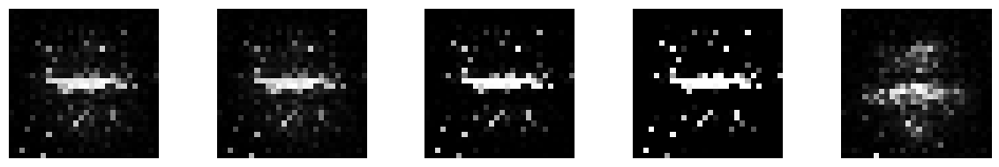

--------------- Epoch 84 ---------------
1/1 [==============================] - 0s 45ms/step


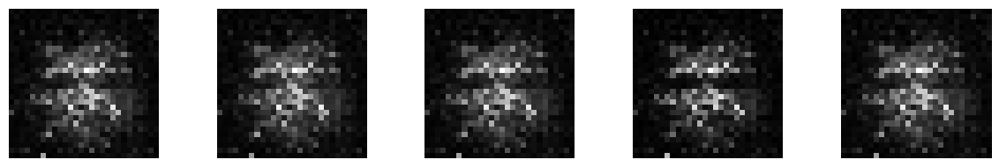

--------------- Epoch 85 ---------------
1/1 [==============================] - 0s 71ms/step


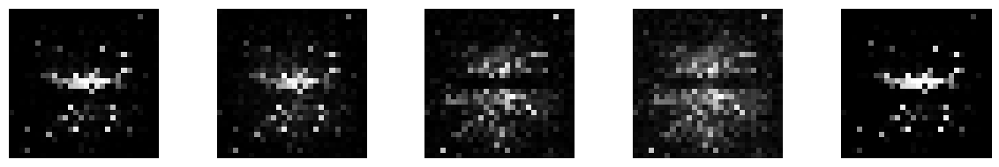

--------------- Epoch 86 ---------------
1/1 [==============================] - 0s 19ms/step


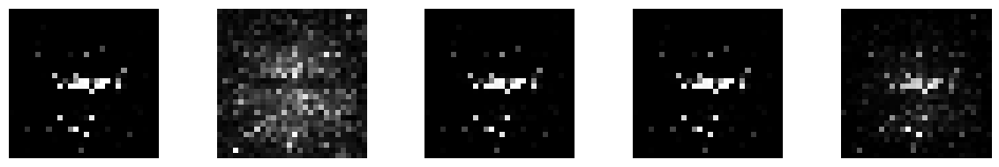

--------------- Epoch 87 ---------------
1/1 [==============================] - 0s 18ms/step


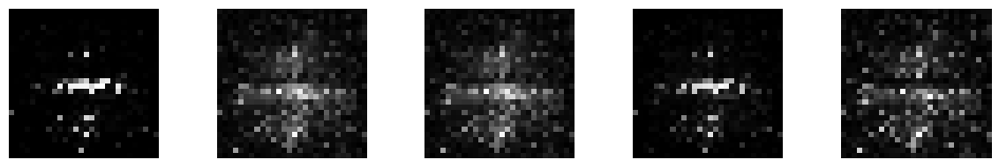

--------------- Epoch 88 ---------------
1/1 [==============================] - 0s 17ms/step


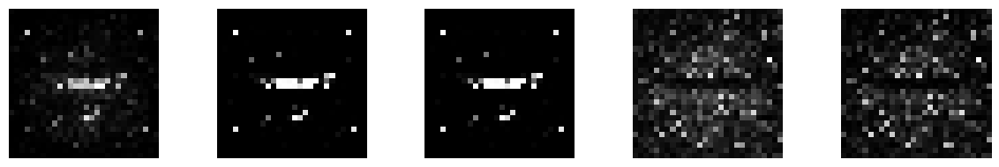

--------------- Epoch 89 ---------------
1/1 [==============================] - 0s 18ms/step


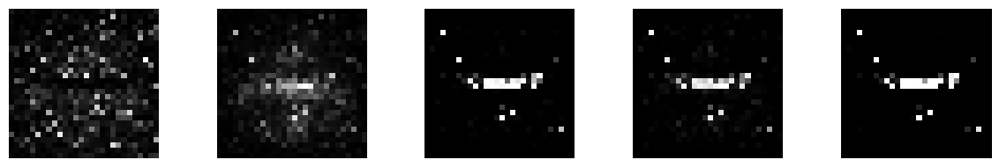

--------------- Epoch 90 ---------------
1/1 [==============================] - 0s 18ms/step


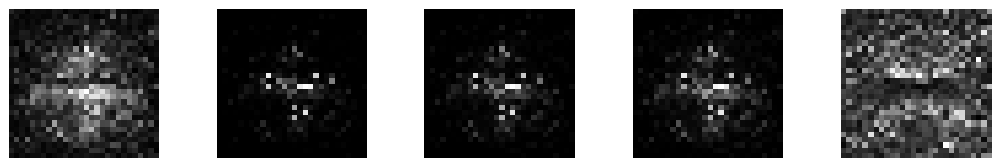

--------------- Epoch 91 ---------------
1/1 [==============================] - 0s 18ms/step


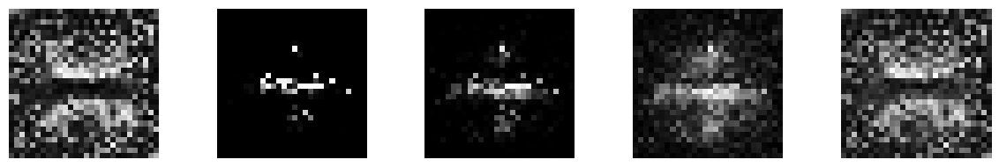

--------------- Epoch 92 ---------------
1/1 [==============================] - 0s 19ms/step


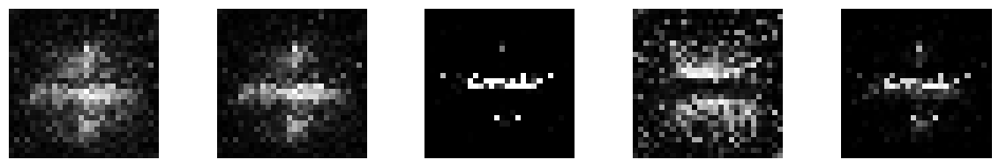

--------------- Epoch 93 ---------------
1/1 [==============================] - 0s 17ms/step


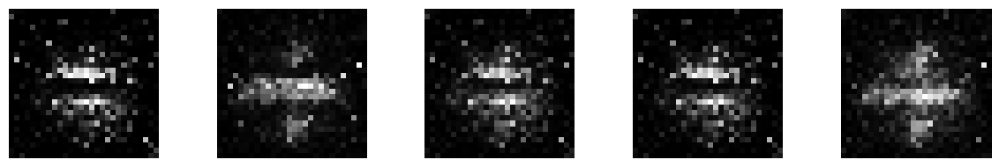

--------------- Epoch 94 ---------------
1/1 [==============================] - 0s 27ms/step


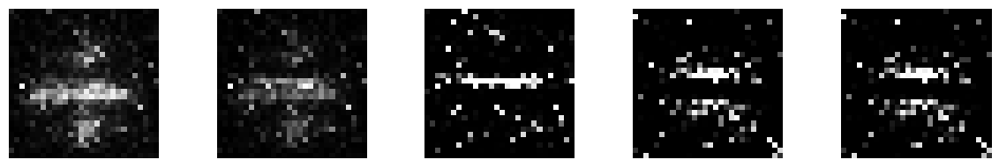

--------------- Epoch 95 ---------------
1/1 [==============================] - 0s 35ms/step


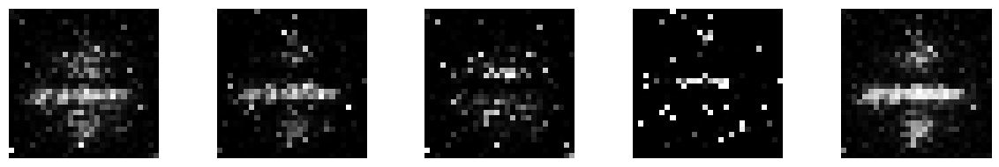

--------------- Epoch 96 ---------------
1/1 [==============================] - 0s 17ms/step


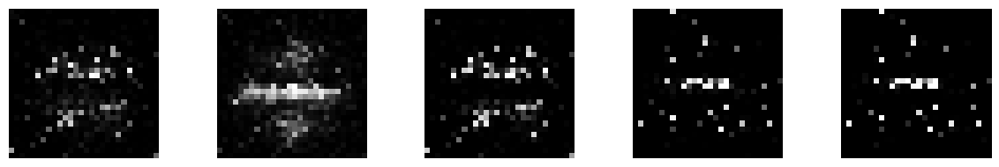

--------------- Epoch 97 ---------------
1/1 [==============================] - 0s 19ms/step


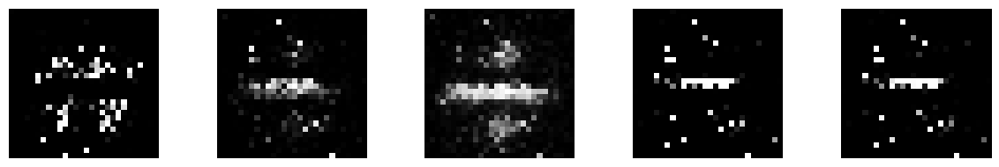

--------------- Epoch 98 ---------------
1/1 [==============================] - 0s 17ms/step


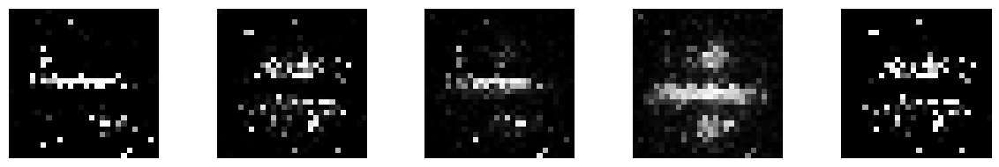

--------------- Epoch 99 ---------------
1/1 [==============================] - 0s 17ms/step


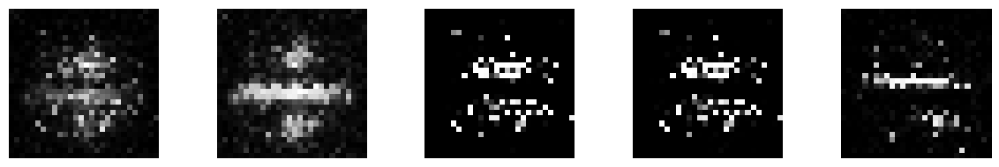

--------------- Epoch 100 ---------------
1/1 [==============================] - 0s 18ms/step


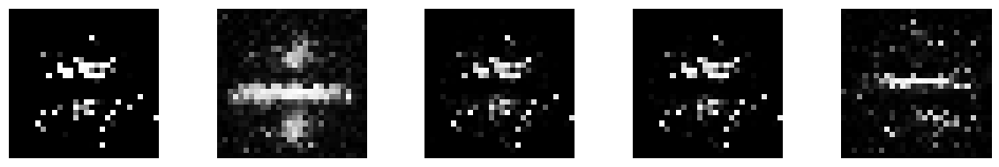

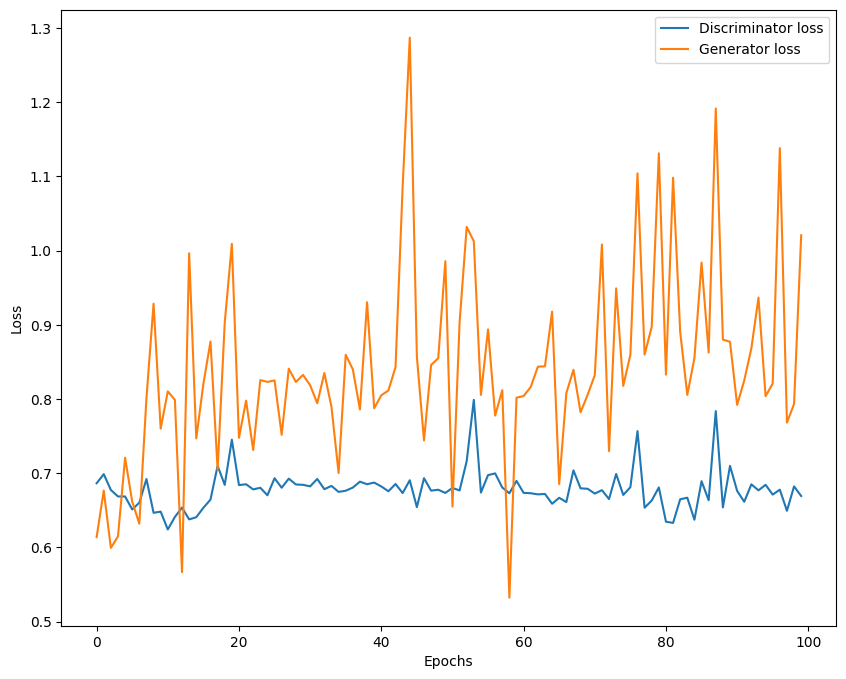

In [53]:
train(z_dim, epochs=100, BATCH_SIZE=256)

### VAE

In [57]:
batch_size = 16
latent_dim = 2  # Number of latent dimension parameters

input_img = tf.keras.layers.Input(shape=(784,), name="input")
x = tf.keras.layers.Dense(512, activation='relu', name="intermediate_encoder")(input_img)
x = tf.keras.layers.Dense(2, activation='relu', name="latent_encoder")(x)

z_mu = tf.keras.layers.Dense(latent_dim)(x)
z_log_sigma = tf.keras.layers.Dense(latent_dim)(x)

def sampling(args):
    z_mu, z_log_sigma = args
    epsilon = tf.keras.backend.random_normal(shape=(tf.keras.backend.shape(z_mu)[0], latent_dim))
    z = z_mu + tf.keras.backend.exp(z_log_sigma) * epsilon
    return z

# sample vector from the latent distribution
z = tf.keras.layers.Lambda(sampling)([z_mu, z_log_sigma])
# decoder takes the latent distribution sample as input
decoder_input = tf.keras.layers.Input((2,), name="input_decoder")

x = tf.keras.layers.Dense(512, activation='relu', name="intermediate_decoder", input_shape=(2,))(decoder_input)

# Expand to 784 total pixels
x = tf.keras.layers.Dense(784, activation='sigmoid', name="original_decoder")(x)

# decoder model statement
decoder = tf.keras.Model(decoder_input, x)

# apply the decoder to the sample from the latent distribution
z_decoded = decoder(z)
decoder.summary()

Model: "model_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_decoder (InputLayer)  [(None, 2)]               0         
                                                                 
 intermediate_decoder (Dens  (None, 512)               1536      
 e)                                                              
                                                                 
 original_decoder (Dense)    (None, 784)               402192    
                                                                 
Total params: 403728 (1.54 MB)
Trainable params: 403728 (1.54 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [58]:
# construct a custom layer to calculate the loss
class CustomVariationalLayer(tf.keras.layers.Layer):

    def vae_loss(self, x, z_decoded):
        x = tf.keras.backend.flatten(x)
        z_decoded = tf.keras.backend.flatten(z_decoded)
        # Reconstruction loss
        xent_loss = tf.keras.losses.binary_crossentropy(x, z_decoded)
        return xent_loss

    # adds the custom loss to the class
    def call(self, inputs):
        x = inputs[0]
        z_decoded = inputs[1]
        loss = self.vae_loss(x, z_decoded)
        self.add_loss(loss, inputs=inputs)
        return x

# apply the custom loss to the input images and the decoded latent distribution sample
y = CustomVariationalLayer()([input_img, z_decoded])
# VAE model statement
vae = tf.keras.Model(input_img, y)
vae.compile(optimizer='rmsprop', loss=None)
vae.summary()

Model: "model_23"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input (InputLayer)          [(None, 784)]                0         []                            
                                                                                                  
 intermediate_encoder (Dens  (None, 512)                  401920    ['input[0][0]']               
 e)                                                                                               
                                                                                                  
 latent_encoder (Dense)      (None, 2)                    1026      ['intermediate_encoder[0][0]']
                                                                                                  
 dense_187 (Dense)           (None, 2)                    6         ['latent_encoder[0][0]'

In [59]:
train_x = X_train.reshape(-1,784) # train_x.reshape(-1, 784)
val_x = X_test.reshape(-1,784) #val_x.reshape(-1, 784)

In [64]:
vae.fit(x=train_x, y=None,
        shuffle=True,
        epochs=100,
        batch_size=batch_size,
        validation_data=(val_x, None))

Epoch 1/100
135/135 [==============================] - 1s 8ms/step - loss: 0.1799 - val_loss: 0.1816
Epoch 2/100
135/135 [==============================] - 1s 4ms/step - loss: 0.1792 - val_loss: 0.1809
Epoch 3/100
135/135 [==============================] - 1s 5ms/step - loss: 0.1785 - val_loss: 0.1807
Epoch 4/100
135/135 [==============================] - 1s 8ms/step - loss: 0.1785 - val_loss: 0.1808
Epoch 5/100
135/135 [==============================] - 1s 8ms/step - loss: 0.1784 - val_loss: 0.1804
Epoch 6/100
135/135 [==============================] - 1s 9ms/step - loss: 0.1783 - val_loss: 0.1804
Epoch 7/100
135/135 [==============================] - 1s 9ms/step - loss: 0.1783 - val_loss: 0.1805
Epoch 8/100
135/135 [==============================] - 1s 10ms/step - loss: 0.1782 - val_loss: 0.1804
Epoch 9/100
135/135 [==============================] - 1s 8ms/step - loss: 0.1781 - val_loss: 0.1804
Epoch 10/100
135/135 [==============================] - 1s 6ms/step - loss: 0.1782 - val_l

1/1 [==============================] - 0s 25ms/step


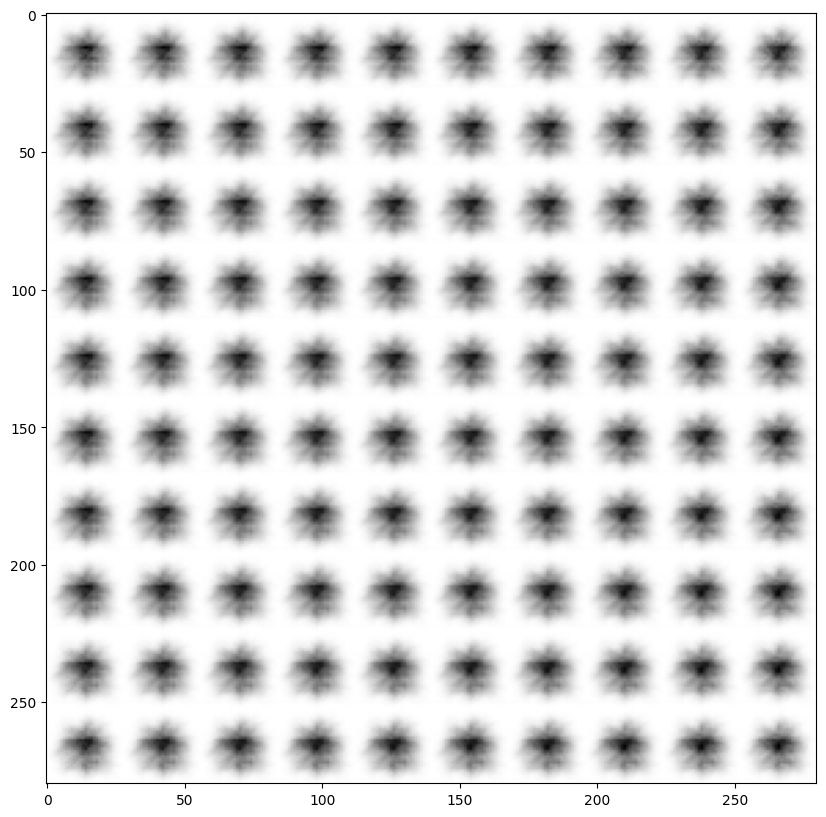

In [65]:
# Display a 2D manifold of the samples
n = 10  # figure with 20x20 samples
digit_size = 28
figure = np.zeros((digit_size * n, digit_size * n))

# Construct grid of latent variable values - can change values here to generate different things
grid_x = norm.ppf(np.linspace(0.05, 0.95, n))
grid_y = norm.ppf(np.linspace(0.05, 0.95, n))

# decode for each square in the grid
for i, yi in enumerate(grid_x):
    for j, xi in enumerate(grid_y):
        z_sample = np.array([[xi, yi]])
        z_sample = np.tile(z_sample, batch_size).reshape(batch_size, 2)

        x_decoded = decoder.predict(z_sample, batch_size=batch_size)

        digit = x_decoded[0].reshape(digit_size, digit_size)

        figure[i * digit_size: (i + 1) * digit_size,
               j * digit_size: (j + 1) * digit_size] = digit

plt.figure(figsize=(10, 10))
plt.imshow(figure, cmap='gray')
plt.show()

135/135 [==============================] - 0s 2ms/step


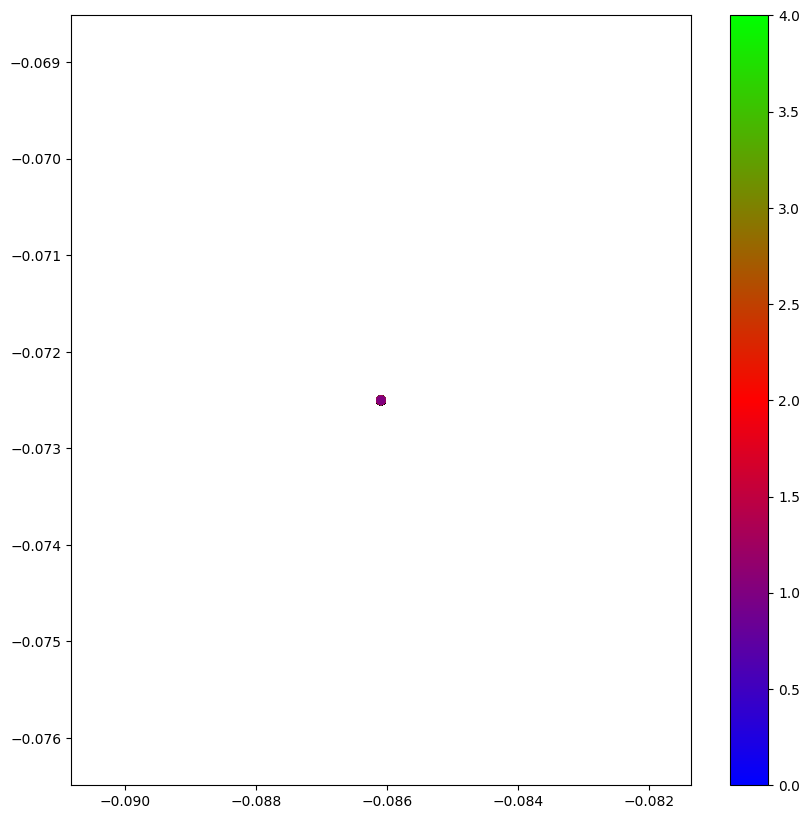

In [66]:
encoder = tf.keras.Model(input_img, z_mu) # works on older version of TF and Keras
x_valid_noTest_encoded = encoder.predict(train_x, batch_size=batch_size)
plt.figure(figsize=(10, 10))
plt.scatter(x_valid_noTest_encoded[:, 0], x_valid_noTest_encoded[:, 1], c=y_train, cmap='brg')
plt.colorbar()
plt.show()

# References


> **Variational Autoencoders and GANs**
>
> Harvard University
>
> Fall 2020
>
> Instructors: Mark Glickman, Pavlos Protopapas, and Chris Tanner
>
> Lab Instructors: Chris Tanner and Eleni Angelaki Kaxiras
>
> Content: Srivatsan Srinivasan, Pavlos Protopapas, Chris Tanner
>
> Link: https://harvard-iacs.github.io/2020-CS109B/labs/lab10/notebook/

